#### Project Setup: Installing the Environment

This first code cell will automatically check your Python environment for all required packages (like `pandas`, `sklearn`, `torch`, and `xgboost`). If any are missing, it will install them using `pip`.

**Please run this cell and wait for it to complete.**

* If it prints "All required packages are already installed," you are ready to proceed.
* If it installs new packages, you may need to **restart the kernel** before running the rest of the notebook. (In Jupyter: `Kernel` > `Restart Kernel...`)

In [4]:
import sys
import subprocess
from importlib.metadata import distributions  # <-- This replaces pkg_resources

# List of required packages
required_packages = {
    "numpy",
    "pandas",
    "matplotlib",
    "seaborn",
    "statsmodels",
    "scikit-learn",
    "xgboost",
    "torch",
    "fredapi",
    "tqdm",
}

# Installation Script
print("Checking environment...")
installed_packages = {dist.metadata["Name"].lower() for dist in distributions()}
missing_packages = required_packages - installed_packages

if not missing_packages:
    print("All required packages are already installed. Environment is ready.")
else:
    print(f"Installing missing packages: {', '.join(missing_packages)}")

    python = sys.executable

    # Run pip install for each missing package
    for package in missing_packages:
        print(f"Installing {package}...")
        try:
            subprocess.check_call(
                [python, "-m", "pip", "install", package],
                stdout=subprocess.DEVNULL,
                stderr=subprocess.DEVNULL,
            )
        except subprocess.CalledProcessError as e:
            print(f"ERROR: Failed to install {package}. Please install it manually.")
            print(e)

    print("\nEnvironment setup complete. You may need to restart the kernel.")

Checking environment...
All required packages are already installed. Environment is ready.


In [5]:
# This cell contains all the main libraries used throughout our analysis.

# Standard Libraries
import copy
import math
import os
from itertools import cycle

# Data Manipulation & Numerics
import numpy as np
import pandas as pd

# Data Visualization
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns

# Stats & Econometrics
from fredapi import Fred
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.contingency_tables import mcnemar
from statsmodels.tsa.stattools import acf

# Machine Learning (Scikit-learn)
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn.linear_model import (
    LogisticRegressionCV,
    MultiTaskElasticNetCV,
    MultiTaskLassoCV,
    RidgeCV,
)
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    mean_squared_error,
    r2_score,
)
from sklearn.model_selection import (
    GridSearchCV,
    TimeSeriesSplit,
    train_test_split,
)
from sklearn.multioutput import MultiOutputClassifier, MultiOutputRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Machine Learning (PyTorch & XGBoost)
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from xgboost import XGBClassifier

# Utilities
from tqdm.auto import tqdm

/opt/miniconda3/envs/myenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
import random

# Set the master seed
SEED = 42


def set_all_seeds(seed):
    """Sets the seed for all major sources of randomness."""

    # 1. Python's built-in random module
    random.seed(seed)

    # 2. NumPy
    np.random.seed(seed)

    # 3. PyTorch (for CPU and GPU)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  # if you are using multi-GPU
        # These are required for full reproducibility on CU-DNN
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False

    # 4. Set Python Hash Seed (for dictionary key, set, etc. iteration)
    os.environ["PYTHONHASHSEED"] = str(seed)

    print(f"Global seeds for random, numpy, and torch set to {seed}.")
    if torch.cuda.is_available():
        print(
            "PyTorch CUDA seeds set. Note: cuDNN deterministic mode is on, which may impact performance."
        )


set_all_seeds(SEED)

Global seeds for random, numpy, and torch set to 42.


# 1. Introduction

The U.S. yield curve is a cornerstone of global finance, serving as the primary tool for pricing assets, managing risk, and conducting asset-liability management (ALM). Given its importance, yield curve forecasting is a central challenge in quantitative finance. While traditional econometric models like the Dynamic Nelson-Siegel are foundational, modern machine learning (ML) offers a promising alternative, capable of handling high-dimensional datasets and capturing complex, non-linear patterns that linear models may miss.

This notebook documents a comprehensive, empirical study comparing the efficacy of classical and modern ML techniques for this task. Our research followed a two-stage process. We first tested a series of regularized linear regressions (Ridge, Lasso, ElasticNet) on high-frequency **daily** data. This approach, however, failed to produce any meaningful out-of-sample (OOS) predictive power, with models showing severe overfitting.

Based on these findings, we pivoted our methodology to test a more tractable hypothesis. We hypothesized that a simpler problem definition would yield a clearer signal. We therefore:
1.  **Aggregated the data to a weekly frequency** to filter daily noise.
2.  **Simplified the task from regression to binary classification**, predicting only the *direction* of weekly yield changes.

On this new weekly classification framework, we trained and evaluated a comprehensive suite of models:
* **Logistic Regression (with L2-CV)**
* **Random Forest**
* **XGBoost**
* **Long Short-Term Memory (LSTM) Network**

The models are trained using a rigorous rolling-window framework (15-year train, 4-week forecast) and evaluated using statistical significance tests (McNemar's) to validate their performance against a naive benchmark. This project's goal is to identify the most robust modeling technique, feature set, and methodology for this complex forecasting challenge.

# 2. Data Collection & Preprocessing

## 2.1. FRED

To capture the macroeconomic and financial drivers of the yield curve, we source exogenous predictors from the Federal Reserve Economic Data (FRED) repository, maintained by the Research Division of the Federal Reserve Bank of St. Louis. FRED is widely recognized as the premier open-access database for U.S. economic time series.

In [4]:
api_key = "615add3bd441c0ed42dec47e952d69e2"
fred_api = Fred(api_key=api_key)

This section defines the complete set of predictors (features) for our yield curve forecasting models. The features are selected based on established economic theory and are identified by their FRED ticker. There are 94 of them in total.

The selection provides a comprehensive view of the macro-financial environment by covering all major drivers of interest rates:

- Production & Income: Leading indicators for economic health.

- Labor Market: Employment/unemployment data, a key dual-mandate component.

- Housing & Consumption: Interest-rate sensitive sectors.

- Money & Credit: Monetary aggregates and bank lending activity.

- Price Indexes: Key inflation measures (CPI, PCE) monitored by the Fed.

- Fiscal Variables: Government spending, debt, and deficit data.

- Domestic Yields: The full US Treasury curve, serving as autoregressive features.
 
- International Yields: "Safe haven" yields from other major economies.

- Stock Market & FX: Broader market sentiment and capital flows.

- Risk & Volatility: Measures of market stress and oil prices.

- Monetary Policy (Traditional): The target Fed Funds Rate.

- Monetary Policy (Unconventional): Fed balance sheet data (QE/QT).

- Inflation Expectations: Market-based forward inflation expectations.

To ensure maximum information, all variables were extracted from the FRED database at their highest available frequency. This resulted in a mixed-frequency dataset:

- Daily: Most financial markets data

- Monthly: Most macroeconomic variables

- Quarterly: Most fiscal variables

- Limitations and Missing Data

It's important to note that some key features, such as Gold and the S&P 500, were not available in this initial FRED extraction. These will need to be sourced from an alternative database to complete the feature set.

In [7]:
# --- Master Feature Set & Sample Period Definition ---

fred_ticker = [
    # 1. Production and Income
    "RPI",  # Real Personal Income
    "INDPRO",  # Industrial Production Index
    # 2. Labor Market
    "UNRATE",  # Unemployment Rate
    "UEMP5TO14",  # Short-Term Unemployment (5-14 wks)
    "UEMP27OV",  # Long-Term Unemployment (27+ wks)
    "PAYEMS",  # Total Non-Farm Payroll
    "USGOOD",  # Employment: Goods-Producing
    "CES1021000001",  # Employment: Mining
    "USCONS",  # Employment: Construction
    "MANEMP",  # Employment: Manufacturing
    "DMANEMP",  # Employment: Durable Goods
    "NDMANEMP",  # Employment: Non-Durable Goods
    "SRVPRD",  # Employment: Private Service-Providing
    "USTPU",  # Employment: Trade, Transport, Utilities
    "USWTRADE",  # Employment: Wholesale Trade
    "USTRADE",  # Employment: Retail Trade
    "USFIRE",  # Employment: Financial Activities
    "USGOVT",  # Employment: Government
    # 3. Consumption and Housing
    "HOUST",  # Housing Starts
    "PERMIT",  # Building Permits
    "UMCSENT",  # U. of Michigan Consumer Sentiment
    # 4. Money and Credit
    "M1SL",  # M1 Money Stock
    "M2SL",  # M2 Money Stock
    "M2REAL",  # Real M2 Money Stock
    "TOTRESNS",  # Total Bank Reserves
    "NONBORRES",  # Non-Borrowed Bank Reserves
    "BUSLOANS",  # Commercial & Industrial Loans
    "REALLN",  # Real Estate Loans (All)
    "NONREVSL",  # Non-Revolving Consumer Credit
    "DTCOLNVHFNM",  # Non-Financial Corporate Liabilities
    "DTCTHFNM",  # Household Liabilities
    "INVEST",  # Gross Private Domestic Investment
    # 5. Price Indexes (Inflation)
    "CPIAUCSL",  # CPI (All Urban Consumers)
    "CPIAPPSL",  # CPI: Apparel
    "CPITRNSL",  # CPI: Transportation
    "CPIMEDSL",  # CPI: Medical Care
    "CUSR0000SAC",  # CPI: Commodities
    "CUUR0000SAD",  # CPI: Durables
    "CUSR0000SAS",  # CPI: Services
    "CPIULFSL",  # CPI: All Items Less Food
    "CUUR0000SA0L2",  # CPI: All Items Less Shelter
    "CUSR0000SA0L5",  # CPI: All Items Less Food & Energy
    "PCEPI",  # PCE: Price Index (Fed's Target)
    "DDURRG3M086SBEA",  # PCE: Durable Goods
    "DNDGRG3M086SBEA",  # PCE: Non-Durable Goods
    "DSERRG3M086SBEA",  # PCE: Services
    # 6. Fiscal Variables
    "FGEXPND",  # Federal Government Expenditures (Q)
    "FGRECPT",  # Federal Government Receipts (Q)
    "FGDEF",  # Federal Government Deficit (Q)
    "FGCE",  # Federal Government Spending (Q)
    "MTSDS133FMS",  # Federal Surplus/Deficit (M)
    "FYGFDPUN",  # Federal Debt Held by Public (Q)
    "GFDEGDQ188S",  # Debt-to-GDP Ratio (Q)
    "A091RC1Q027SBEA",  # Net Interest Payments (Q)
    "GFDEBTN",  # Total Public Debt Outstanding (M)
    # 7. Domestic Yield Variables
    "DGS1MO",
    "DGS3MO",
    "DGS6MO",  # T-Bills (< 1Y)
    "DGS1",
    "DGS2",
    "DGS3",
    "DGS5",
    "DGS7",
    "DGS10",
    "DGS20",
    "DGS30",  # T-Notes/Bonds (>= 1Y)
    # 8. International Yields
    "IRLTLT01DEM156N",  # 10Y German Bund
    "IRLTLT01JPM156N",  # 10Y Japanese Govt Bond
    "IRLTLT01GBM156N",  # 10Y UK Gilt
    "IRLTLT01CAM156N",  # 10Y Canadian Govt Bond
    "IRLTLT01AUM156N",  # 10Y Australian Govt Bond
    "IRLTLT01FRM156N",  # 10Y French Govt Bond
    # 9. Stock Markets, FX, and Corporate Bonds
    "NASDAQCOM",  # NASDAQ Composite Index
    "AAA",  # Moody's Seasoned AAA Corporate Bond Yield
    "BAA",  # Moody's Seasoned BAA Corporate Bond Yield
    "DEXUSEU",  # USD / EUR
    "DEXJPUS",  # JPY / USD
    "DEXUSUK",  # USD / GBP
    "DEXCAUS",  # CAD / USD
    "DEXUSAL",  # AUD / USD
    "DEXCHUS",  # CNY / USD
    # 10. Risk & Commodity Variables
    "VIXCLS",  # CBOE Volatility Index (VIX)
    "NFCI",  # National Financial Conditions Index
    "DCOILWTICO",  # WTI Crude Oil Price
    # 11. Traditional Monetary Policy
    "FEDFUNDS",  # Effective Federal Funds Rate
    # 12. Unconventional Monetary Policy (QE/QT)
    "WRESBAL",  # Bank Reserves at Fed
    "CURRCIR",  # Currency in Circulation
    "WTREGEN",  # US Treasury General Account
    "BOGMBASE",  # Monetary Base
    "WSHOSHO",  # Total Assets of the Federal Reserve (Balance Sheet Size)
    "WSHOTSL",  # Fed Holdings: U.S. Treasury Securities
    "WSHOBL",  # Fed Holdings: T-Bonds & T-Notes (> 1Y)
    # 13. Market Inflation Expectations
    "T5YIE",  # 5-Year Breakeven Inflation Rate
    "T10YIE",  # 10-Year Breakeven Inflation Rate
]

Sample Period and Data Frequency : The 'start_date' is set to September 2002, as this date provides the best compromise for data availability across our large feature set. Many series have missing or incomplete data before this point.

- The sample period for this dataset spans from 2003-01-02 to 2025-08-01.


In [8]:
start_date = "2002-09-01"
end_date = "2025-08-01"

In [ ]:
fred = {}
for feature in fred_ticker:
    print(feature)
    try:
        series = fred_api.get_series(
            feature, observation_start=start_date, observation_end=end_date
        )
        fred[feature] = series
    except ValueError:
        print(f"Could not retrieve data for {feature}.")
        continue

Helper Function: Stationarity & Transformation Check

This utility visualizes four key transformations to determine the optimal input for modeling.

* **Original:** Baseline check for trends, seasonality, and outliers.
* **Diff ($\Delta X_t$):** Removes linear trends to test for **mean reversion** (stationarity).
* **Log ($\ln X_t$):** Stabilizes growing variance (heteroscedasticity) often seen in financial data.
* **Log-Diff ($\Delta \ln X_t$):** Approximates **percentage returns**. Combines trend removal and variance stabilization; usually the target state for modeling.

In [8]:
def plot_transformations(ts_dict):
    """
    Plots Original, Diff, Log, and Log-Diff transformations.

    Args:
        ts_dict: Dictionary of time series (pandas Series).
    """
    for key, ts in ts_dict.items():
        # 1. Data Prep
        # Drop NaNs explicitly to avoid plotting gaps
        ts_clean = ts.dropna()

        # 2. Transformations
        ts_diff1 = ts_clean.diff()

        # SAFETY: Log of negative numbers or zero is undefined (-inf/nan).
        # We use .where() to filter, so we don't crash the script.
        ts_log = np.log(ts_clean.where(ts_clean > 0))

        ts_log_diff = ts_log.diff()

        # 3. Plotting
        fig, axes = plt.subplots(1, 4, figsize=(24, 5), constrained_layout=True)
        fig.suptitle(f"Stationarity Check: {key}", fontsize=16, weight="bold")

        # Helper to style each subplot consistently
        def style_plot(ax, data, title, color):
            ax.plot(data, color=color, linewidth=1.5)
            ax.set_title(title, fontsize=12, weight="bold")
            ax.grid(True, linestyle="--", alpha=0.5)  # Grids help read values
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)

        style_plot(axes[0], ts_clean, "Original Level", "#1f77b4")  # Blue
        style_plot(
            axes[1], ts_diff1, r"First Difference ($\Delta$)", "#ff7f0e"
        )  # Orange
        style_plot(axes[2], ts_log, r"Log Level ($ln$)", "#2ca02c")  # Green
        style_plot(axes[3], ts_log_diff, r"Log Returns ($\Delta ln$)", "#d62728")  # Red

        plt.show()
        plt.close(fig)

In [ ]:
plot_transformations(fred)

After visually inspecting the time series plots for all features, we identified non-stationary behaviors (such as trends and varying variance) in many variables. To prepare the dataset for modeling, we applied specific transformations to induce stationarity:

* **Log-Difference (`logdiff`):** Applied to variables showing exponential growth or trends (e.g., Production, Employment, Money Supply).
* **Difference (`diff`):** Applied to interest rates, yields, and ratios that are already in percentage terms.
* **Remove:** Variables identified as redundant, excessively noisy, or lacking clear predictive signal were excluded from the feature set.

In [10]:
# Variables to Log-Difference (Growth Rates)
vars_logdiff = [
    "RPI",
    "INDPRO",
    "UNRATE",
    "UEMP5TO14",
    "PAYEMS",
    "USGOOD",
    "USCONS",
    "MANEMP",
    "DMANEMP",
    "NDMANEMP",
    "SRVPRD",
    "USTPU",
    "USWTRADE",
    "USTRADE",
    "USFIRE",
    "USGOVT",
    "HOUST",
    "PERMIT",
    "UMCSENT",
    "M1SL",
    "M2SL",
    "M2REAL",
    "TOTRESNS",
    "NONREVSL",
    "DTCOLNVHFNM",
    "DTCTHFNM",
    "CPIAUCSL",
    "CPIAPPSL",
    "CPITRNSL",
    "CUSR0000SAC",
    "CUUR0000SAD",
    "CPIULFSL",
    "CUUR0000SA0L2",
    "PCEPI",
    "DNDGRG3M086SBEA",
    "FGEXPND",
    "GFDEGDQ188S",
    "GFDEBTN",
    "NASDAQCOM",
    "DEXUSEU",
    "DEXJPUS",
    "DEXUSUK",
    "DEXCAUS",
    "DEXUSAL",
    "VIXCLS",
    "DCOILWTICO",
    "FEDFUNDS",
    "CURRCIR",
    "BOGMBASE",
    "WSHOSHO",
    "WSHOTSL",
]

# Variables to Difference (Changes in Levels/Rates)
vars_diff = [
    "FGDEF",
    "MTSDS133FMS",
    "FYGFDPUN",
    "DGS1MO",
    "DGS3MO",
    "DGS6MO",
    "DGS1",
    "DGS2",
    "DGS3",
    "DGS5",
    "DGS7",
    "DGS10",
    "DGS20",
    "DGS30",
    "IRLTLT01DEM156N",
    "IRLTLT01JPM156N",
    "IRLTLT01GBM156N",
    "IRLTLT01CAM156N",
    "IRLTLT01AUM156N",
    "IRLTLT01FRM156N",
    "AAA",
    "BAA",
    "NFCI",
    "T5YIE",
    "T10YIE",
]

# Variables to Remove
vars_remove = [
    "UEMP27OV",
    "CES1021000001",
    "NONBORRES",
    "BUSLOANS",
    "REALLN",
    "INVEST",
    "CPIMEDSL",
    "CUSR0000SAS",
    "CUSR0000SA0L5",
    "DDURRG3M086SBEA",
    "DSERRG3M086SBEA",
    "FGRECPT",
    "FGCE",
    "A091RC1Q027SBEA",
    "DEXCHUS",
    "WRESBAL",
    "WTREGEN",
    "WSHOBL",
]

dic_modif = {}

for var in vars_logdiff:
    dic_modif[var] = ["logdiff"]

for var in vars_diff:
    dic_modif[var] = ["diff"]

for var in vars_remove:
    dic_modif[var] = ["remove"]

In [11]:
for key, value in dic_modif.items():
    if key in fred.keys():
        if value == ["remove"]:
            del fred[key]

        elif value == ["logdiff"]:
            # Apply Log-Difference (Growth Rate)
            # Note: np.log will result in -inf/NaN if data <= 0
            fred[key] = np.log(fred[key]).diff()

        elif value == ["diff"]:
            # Apply Simple Difference (Change in Level)
            fred[key] = fred[key].diff()

/opt/python/lib/python3.13/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


To align features with varying reporting frequencies (weekly, monthly, quarterly) to our modeling timeline, we employ a Forward Fill (Last Observation Carried Forward) strategy. This ensures that at any time t, the model utilizes the most recently disseminated data, preserving the chronological flow of information.

Additionally, we apply a Backward Fill to impute missing values at the very beginning of the sample (early January 2003). This step does not introduce look-ahead bias, as the underlying time series contain historical data predating our analysis start date (January 8th, 2003), meaning these values were historically available at that time.

In [12]:
df_fred = pd.concat(fred, axis=1)
df_fred.columns = fred.keys()
df_fred = df_fred.ffill()
df_fred = df_fred.bfill()
df_fred = df_fred[df_fred.index >= "2003-04-01"]

In [13]:
df_fred.head()

,RPI,INDPRO,UNRATE,UEMP5TO14,PAYEMS,USGOOD,USCONS,MANEMP,DMANEMP,NDMANEMP,...,VIXCLS,NFCI,DCOILWTICO,FEDFUNDS,CURRCIR,BOGMBASE,WSHOSHO,WSHOTSL,T5YIE,T10YIE
2003-04-01,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.027475,-0.01957,-0.054781,0.007968,0.005315,0.006078,0.001565,0.001565,-0.01,0.02
2003-04-02,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.012061,-0.01957,-0.032055,0.007968,0.005315,0.006078,0.000906,0.000906,0.02,0.01
2003-04-03,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,0.006758,-0.01957,0.017362,0.007968,0.005315,0.006078,0.000906,0.000906,-0.02,-0.02
2003-04-04,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,0.032092,-0.02332,-0.022277,0.007968,0.005315,0.006078,0.000906,0.000906,-0.01,-0.01
2003-04-07,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.023620,-0.02332,-0.023145,0.007968,0.005315,0.006078,0.000906,0.000906,-0.02,0.02


## 2.2. Complementary Data : GOLD and S&P 500

### 2.2.2. Gold 

Daily gold USD spot prices are recovered via : https://www.investing.com/currencies/xau-usd-historical-data.

In [14]:
data_path = os.path.join("data", "US", "xau_usd.csv")
data_path2 = os.path.join("data", "US", "xau_usd2.csv")
df_gold = pd.concat(
    [
        pd.read_csv(data_path2, index_col=0, thousands=","),
        pd.read_csv(data_path, index_col=0, thousands=","),
    ]
)

In this step, we transform the raw Gold spot price into Log-Returns to ensure stationarity for our models.

In [ ]:
# Reverse to chronological order
df_gold = df_gold.iloc[::-1]
df_gold.index = pd.to_datetime(df_gold.index)

# Calculate Log Returns
df_gold["XAU_LogReturns"] = np.log(df_gold["Price"]).diff()

# Plotting
fig, ax = plt.subplots(figsize=(12, 4))

ax.plot(
    df_gold.index,
    df_gold["XAU_LogReturns"],
    color="goldenrod",
    linewidth=0.8,
    alpha=0.9,
    label="Daily Log Returns",
)

ax.set_title(
    "Gold Price: Daily Log Returns (Volatility Structure)", fontsize=14, weight="bold"
)
ax.set_ylabel(r"Log Return ($\Delta \ln P$)", fontsize=12)
ax.set_xlabel("Date", fontsize=12)

# Grid and clean borders
ax.grid(True, which="major", linestyle="--", linewidth=0.5, alpha=0.7)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.show()

In [16]:
df_gold = df_gold[["XAU_LogReturns"]]
df_gold.head()

,XAU_LogReturns
Date,
2000-01-03,NaN
2000-01-04,-0.022925
2000-01-05,-0.005147
2000-01-06,0.000818
2000-01-07,0.001847


### 2.2.2. S&P 500

We get daily index level data on the S&P 500 through: https://wrds-www.wharton.upenn.edu

In [17]:
data_path = os.path.join("data", "US", "sp500.csv")
df_sp500 = pd.read_csv(data_path, index_col=0)

In [18]:
df_sp500.head()

,vwretd,vwretx,ewretd,ewretx,sprtrn,spindx
DlyCalDt,,,,,,
2000-01-03,-0.006803,-0.006810,0.002878,0.002860,-0.009549,1455.22
2000-01-04,-0.039652,-0.039679,-0.017465,-0.017486,-0.038345,1399.42
2000-01-05,-0.000935,-0.001009,0.007821,0.007743,0.001922,1402.11
2000-01-06,-0.007391,-0.007547,0.004504,0.004453,0.000956,1403.45
2000-01-07,0.032516,0.032514,0.017008,0.016991,0.027090,1441.47


Similar to the commodity data, we transform the S&P 500 index into Log-Returns to induce stationarity.

In [ ]:
# Calculate Log Returns
df_sp500["SP500_LogReturns"] = np.log(df_sp500["spindx"]).diff()
df_sp500.index = pd.to_datetime(df_sp500.index)

# Plotting
fig, ax = plt.subplots(figsize=(12, 5))

ax.plot(
    df_sp500.index,
    df_sp500["SP500_LogReturns"],
    color="#003366",  # Dark Navy Blue
    linewidth=0.8,
    alpha=0.9,
    label="Daily Log Returns",
)

# Styling
ax.set_title(
    "S&P 500: Daily Log Returns (Volatility Structure)", fontsize=14, weight="bold"
)
ax.set_ylabel(r"Log Return ($\Delta \ln P$)", fontsize=12)
ax.set_xlabel("Date", fontsize=12)

ax.grid(True, axis="y", which="major", linestyle="--", linewidth=0.5, alpha=0.7)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=10))
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
plt.setp(ax.get_xticklabels(), rotation=30, ha="right")
plt.tight_layout()
plt.show()

In [20]:
df_sp500 = df_sp500[["SP500_LogReturns"]]

## 2.3. Merge Datasets

In [21]:
dus = df_fred.merge(
    right=df_gold, how="inner", left_index=True, right_index=True
).merge(right=df_sp500, how="inner", left_index=True, right_index=True)
dus.index = pd.to_datetime(dus.index)
dus.head()

,RPI,INDPRO,UNRATE,UEMP5TO14,PAYEMS,USGOOD,USCONS,MANEMP,DMANEMP,NDMANEMP,...,DCOILWTICO,FEDFUNDS,CURRCIR,BOGMBASE,WSHOSHO,WSHOTSL,T5YIE,T10YIE,XAU_LogReturns,SP500_LogReturns
2003-04-01,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.054781,0.007968,0.005315,0.006078,0.001565,0.001565,-0.01,0.02,-0.007018,0.012071
2003-04-02,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.032055,0.007968,0.005315,0.006078,0.000906,0.000906,0.02,0.01,-0.015396,0.025781
2003-04-03,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,0.017362,0.007968,0.005315,0.006078,0.000906,0.000906,-0.02,-0.02,-0.014099,-0.005064
2003-04-04,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.022277,0.007968,0.005315,0.006078,0.000906,0.000906,-0.01,-0.01,0.000983,0.002735
2003-04-07,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.023145,0.007968,0.005315,0.006078,0.000906,0.000906,-0.02,0.02,-0.008324,0.001228


In [4]:
dp_daily = os.path.join("data", "US", "us_data.parquet")
dus.to_parquet(dp_daily)

NameError: name 'dus' is not defined

Let's also create a weekly frequence dataset.

In [ ]:
dus_weekly = dus.resample("W-FRI").last()
dus_weekly.head()

In [33]:
dp_weekly = os.path.join("data", "US", "us_data_weekly.parquet")
dus_weekly.to_parquet(dp_weekly)

# 3. Exploratory Data Analysis

## 3.1. Importing daily and weekly data

In [7]:
dp_daily = os.path.join("data", "US", "us_data.parquet")
dus_daily = pd.read_parquet(dp_daily)

In [8]:
dp_weekly = os.path.join("data", "US", "us_data_weekly.parquet")
dus_weekly = pd.read_parquet(dp_weekly)

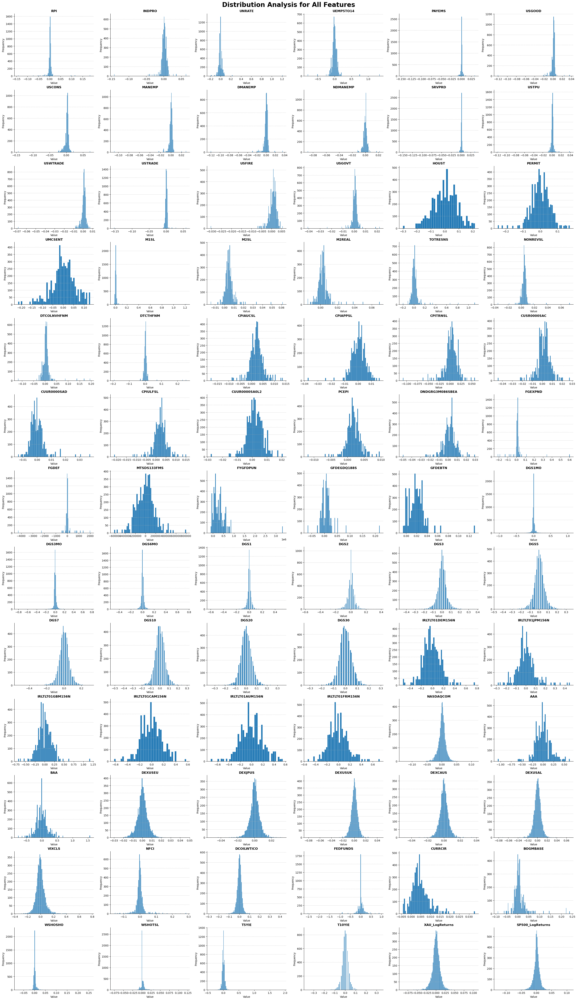

In [9]:
columns = dus_daily.columns
n_features = len(columns)

ncols = 6
nrows = int(np.ceil(n_features / ncols))

# Create Figure & Subplots
fig, axes = plt.subplots(
    nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 4), constrained_layout=True
)

fig.suptitle(
    "Distribution Analysis for All Features",
    fontsize=24,
    weight="bold",
)

# We use axes.flatten() to make iterating easy
for i, ax in enumerate(axes.flatten()):
    if i < n_features:
        col_name = columns[i]
        data = dus_daily[col_name].dropna()

        ax.hist(
            data,
            bins="auto",
            color="#1f77b4",
            edgecolor="white",
            linewidth=0.5,
        )

        # Styling
        ax.set_title(col_name, fontsize=12, weight="bold")
        ax.set_xlabel("Value", fontsize=10)
        ax.set_ylabel("Frequency", fontsize=10)

        ax.grid(True, axis="y", linestyle="--", alpha=0.6)

        # Remove the top and right "box lines"
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)

    else:
        ax.set_visible(False)

plt.show()

## 3.2. Exploration and Feature Engineering

### 3.2.1. Daily Data

Let's start by analyzing our targets' autocorrelations and partial autocorrelations.

In [10]:
yields = [
    "DGS1MO",
    "DGS3MO",
    "DGS6MO",
    "DGS1",
    "DGS2",
    "DGS3",
    "DGS5",
    "DGS7",
    "DGS10",
    "DGS20",
    "DGS30",
]

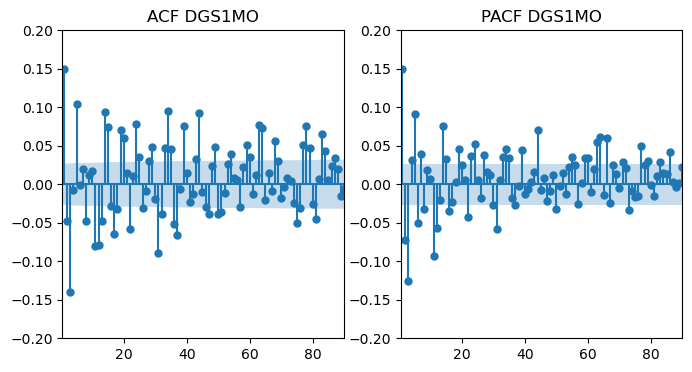

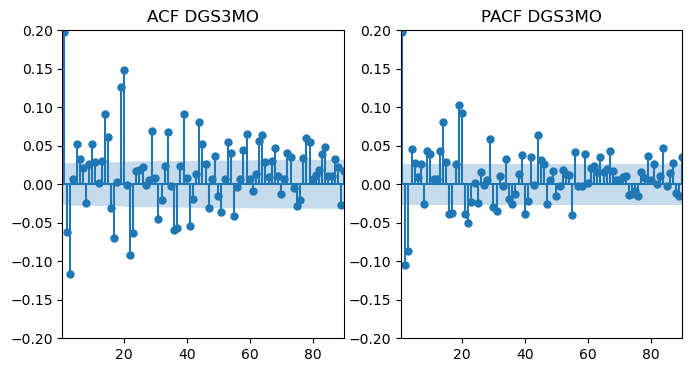

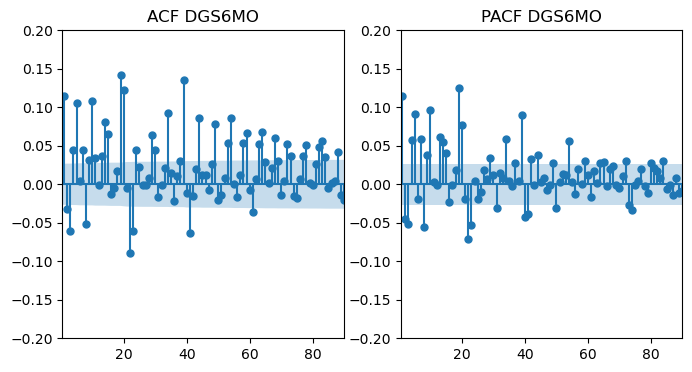

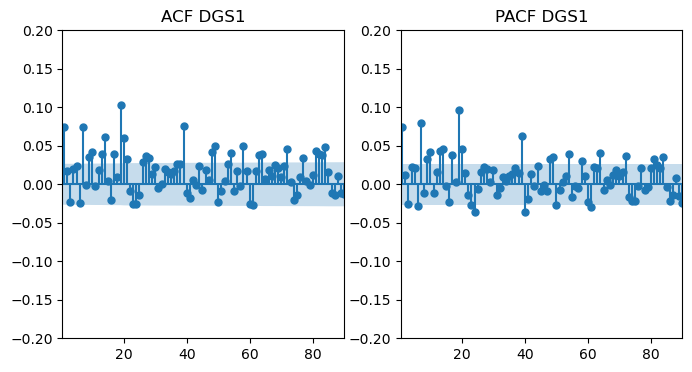

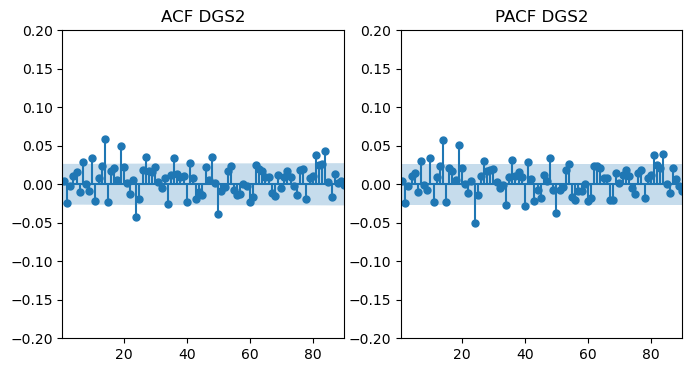

...

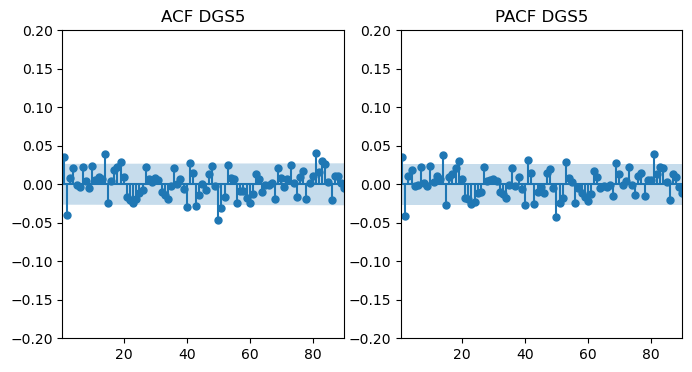

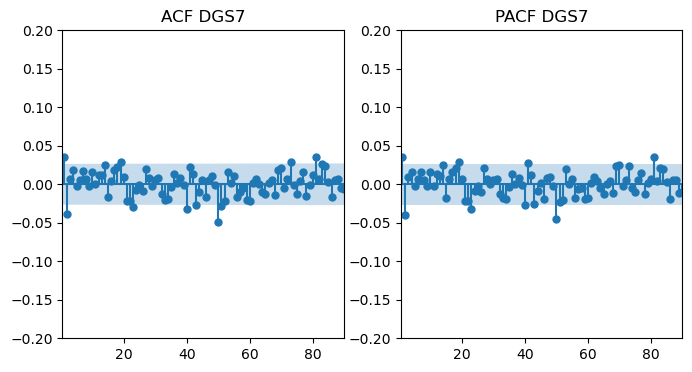

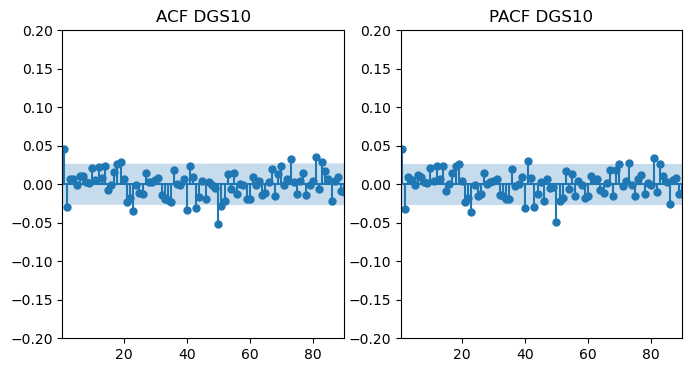

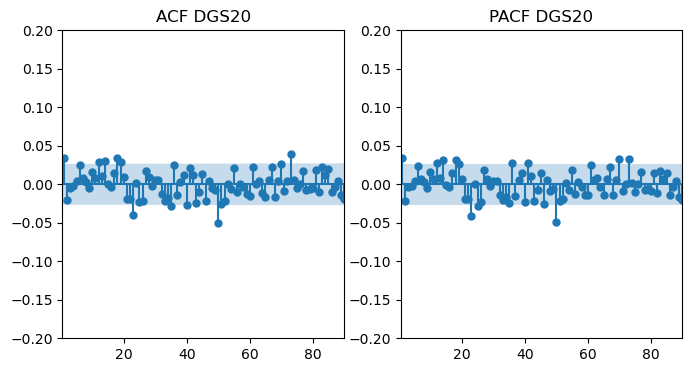

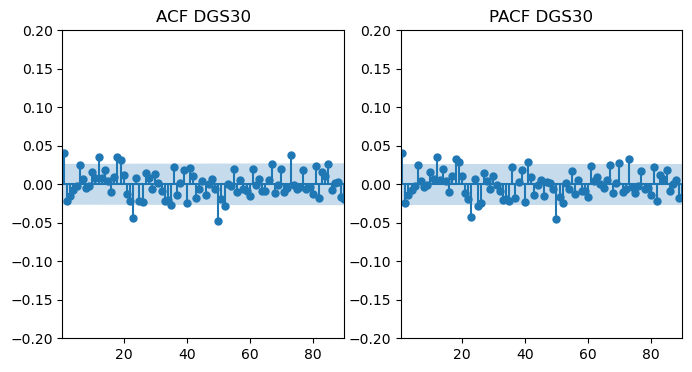

In [11]:
for y in yields:
    series = dus_daily[y]
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    plot_acf(series, lags=90, title=f"ACF {y}", ax=axes[0])
    plot_pacf(series, lags=90, title=f"PACF {y}", ax=axes[1])

    for ax in axes:
        ax.set_xlim(0.5, 90)
        ax.set_ylim(-0.2, 0.2)
    plt.show()


- Short-Term Yields: These show strong, persistent serial correlation. The autocorrelation function (ACF) decays slowly, meaning returns from numerous past lags (up to 30 days) are significantly correlated with near-future returns.

- Long-Term Yields: These show a much faster ACF decay. Only the most immediate past returns (t-1, t-2) show a slight correlation with the next day's return. Surprisingly, we also see a persistent, anomalous correlation at more distant, specific lags (t-25 and t-50).

Let's add some new features : lagged yields. To capture the different "memories" of the yield curve, we engineered a maturity-dependent lag structure for our features:

- For Short-Term Maturities (< 1 Year): A dense set of 10 lags was used to model their complex, high-frequency dynamics: t-1, t-2, t-5, t-10, t-15, t-20, t-25, t-30, t-40, and t-50.

- For Long-Term Maturities (>= 1 Year): A sparser, more parsimonious set of 5 lags was selected: t-1, t-2, t-10, t-25, and t-50.


In [12]:
for lag in [1, 2, 5, 10, 15, 20, 25, 30, 40, 50]:
    dus_daily[f"DGS1MO_t-{lag}"] = dus_daily["DGS1MO"].shift(lag)
    dus_daily[f"DGS3MO_t-{lag}"] = dus_daily["DGS3MO"].shift(lag)
    dus_daily[f"DGS6MO_t-{lag}"] = dus_daily["DGS6MO"].shift(lag)
    dus_daily[f"DGS1_t-{lag}"] = dus_daily["DGS1"].shift(lag)


for lag in [1, 2, 10, 15, 25, 50]:
    dus_daily[f"DGS1_t-{lag}"] = dus_daily["DGS1"].shift(lag)
    dus_daily[f"DGS2_t-{lag}"] = dus_daily["DGS2"].shift(lag)
    dus_daily[f"DGS3_t-{lag}"] = dus_daily["DGS3"].shift(lag)
    dus_daily[f"DGS5_t-{lag}"] = dus_daily["DGS5"].shift(lag)
    dus_daily[f"DGS7_t-{lag}"] = dus_daily["DGS7"].shift(lag)
    dus_daily[f"DGS10_t-{lag}"] = dus_daily["DGS10"].shift(lag)
    dus_daily[f"DGS20_t-{lag}"] = dus_daily["DGS20"].shift(lag)
    dus_daily[f"DGS30_t-{lag}"] = dus_daily["DGS30"].shift(lag)

Let's set up the targets to do some feature selection. Note that former yield columns can then be dropped.

In [13]:
dus_daily["Y_DGS1MO"] = dus_daily["DGS1MO"].shift(-1)
dus_daily["Y_DGS3MO"] = dus_daily["DGS3MO"].shift(-1)
dus_daily["Y_DGS6MO"] = dus_daily["DGS6MO"].shift(-1)
dus_daily["Y_DGS1"] = dus_daily["DGS1"].shift(-1)
dus_daily["Y_DGS2"] = dus_daily["DGS2"].shift(-1)
dus_daily["Y_DGS3"] = dus_daily["DGS3"].shift(-1)
dus_daily["Y_DGS5"] = dus_daily["DGS5"].shift(-1)
dus_daily["Y_DGS7"] = dus_daily["DGS7"].shift(-1)
dus_daily["Y_DGS10"] = dus_daily["DGS10"].shift(-1)
dus_daily["Y_DGS20"] = dus_daily["DGS20"].shift(-1)
dus_daily["Y_DGS30"] = dus_daily["DGS30"].shift(-1)

dus_daily = dus_daily.drop(
    columns=[
        "DGS1MO",
        "DGS3MO",
        "DGS6MO",
        "DGS1",
        "DGS2",
        "DGS3",
        "DGS5",
        "DGS7",
        "DGS10",
        "DGS20",
        "DGS30",
    ]
)

Let's explore the correlation heatmap between our time series.

<Axes: >

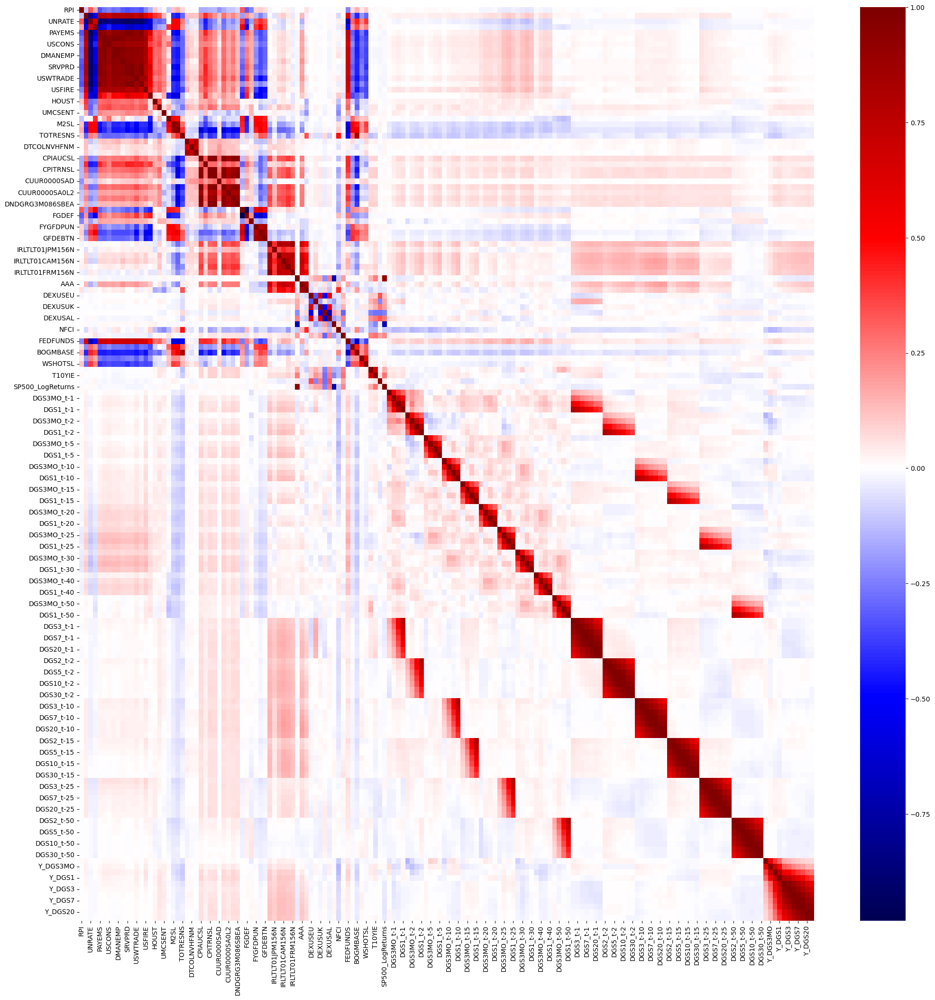

In [14]:
plt.figure(figsize=(25, 25))
sns.heatmap(dus_daily.corr(), cmap="seismic", center=0)

Our preliminary analysis revealed that most features have a low individual correlation with the target yield directions. To build a more parsimonious model and reduce noise, we implemented a two-tiered feature selection process based on absolute correlation coefficients:

- Lagged Features: We set a higher threshold of 0.05. Any lagged feature with an absolute correlation below this value for all target variables was removed.

- Other Features: We used a more lenient threshold of 0.03. This distinction was critical, as a uniform 0.05 filter was found to be overly aggressive, removing theoretically important predictors such as the S&P 500, gold, and the VIX.

Furthermore, we observed significant multicollinearity among the remaining lagged features. To address this, we will also test model variants that incorporate Principal Component Analysis (PCA) within the pipeline. This step transforms the correlated lagged features into a smaller set of orthogonal components, which should improve model stability and reduce overfitting.

In [15]:
Y = dus_daily[["Y_" + y for y in yields]]
Y.head()

,Y_DGS1MO,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30
2003-04-01,0.00,0.01,0.02,0.06,0.10,0.11,0.11,0.13,0.10,0.09,0.09
2003-04-02,0.00,-0.02,-0.02,-0.04,-0.05,-0.04,-0.02,-0.03,-0.01,0.01,0.01
2003-04-03,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.03,0.03,0.02,0.04
2003-04-04,0.02,0.06,0.07,0.07,0.10,0.10,0.11,0.07,0.07,0.04,0.04
2003-04-07,0.00,-0.02,-0.02,-0.04,-0.06,-0.07,-0.08,-0.08,-0.08,-0.08,-0.08


In [16]:
dus_daily_lagged_features = dus_daily[
    [col for col in dus_daily.columns if "_t-" in col]
]
dus_daily_other = dus_daily.drop(
    columns=[col for col in dus_daily.columns if "_t-" in col]
)

corrs = pd.DataFrame(
    {target: dus_daily_lagged_features.corrwith(Y[target]) for target in Y.columns}
).abs()

mask = (corrs < 0.05).all(axis=1)
low_corr_lagged_features = corrs.index[mask]

dus_daily_filtered = dus_daily.drop(columns=low_corr_lagged_features)

corrs = pd.DataFrame(
    {target: dus_daily_other.corrwith(Y[target]) for target in Y.columns}
).abs()

mask = (corrs < 0.03).all(axis=1)
low_corr_other_features = corrs.index[mask]

dus_daily_filtered = dus_daily_filtered.drop(columns=low_corr_other_features)
dus_daily_filtered = dus_daily_filtered.dropna()

print(
    f"{len(low_corr_lagged_features)} lagged features were removed, namely:\
    \n {low_corr_lagged_features.values},\nand {len(low_corr_other_features)}\
    other features were deleted, namely:\n{low_corr_other_features.values}."
)


65 lagged features were removed, namely:    
 ['DGS1_t-1' 'DGS1MO_t-5' 'DGS1_t-5' 'DGS1_t-10' 'DGS1MO_t-15'
 'DGS3MO_t-15' 'DGS6MO_t-15' 'DGS1_t-15' 'DGS1MO_t-20' 'DGS3MO_t-20'
 'DGS6MO_t-20' 'DGS1_t-20' 'DGS1MO_t-25' 'DGS3MO_t-25' 'DGS6MO_t-25'
 'DGS1_t-25' 'DGS6MO_t-30' 'DGS1_t-30' 'DGS1_t-40' 'DGS1MO_t-50'
 'DGS3MO_t-50' 'DGS6MO_t-50' 'DGS1_t-50' 'DGS2_t-1' 'DGS3_t-1' 'DGS5_t-1'
 'DGS7_t-1' 'DGS10_t-1' 'DGS20_t-1' 'DGS30_t-1' 'DGS2_t-2' 'DGS3_t-2'
 'DGS5_t-2' 'DGS7_t-2' 'DGS10_t-2' 'DGS20_t-2' 'DGS30_t-2' 'DGS2_t-10'
 'DGS3_t-10' 'DGS5_t-10' 'DGS7_t-10' 'DGS10_t-10' 'DGS20_t-10'
 'DGS30_t-10' 'DGS2_t-15' 'DGS3_t-15' 'DGS5_t-15' 'DGS7_t-15' 'DGS10_t-15'
 'DGS20_t-15' 'DGS30_t-15' 'DGS2_t-25' 'DGS3_t-25' 'DGS5_t-25' 'DGS7_t-25'
 'DGS10_t-25' 'DGS20_t-25' 'DGS30_t-25' 'DGS2_t-50' 'DGS3_t-50'
 'DGS5_t-50' 'DGS7_t-50' 'DGS10_t-50' 'DGS20_t-50' 'DGS30_t-50'],
and 26    other features were deleted, namely:
['RPI' 'INDPRO' 'UNRATE' 'UEMP5TO14' 'PAYEMS' 'SRVPRD' 'USTPU' 'USTRADE'
 'USGOVT' '

Let's plot the correlation heatmap once again now that the dataframe is partly filtered.

<Axes: >

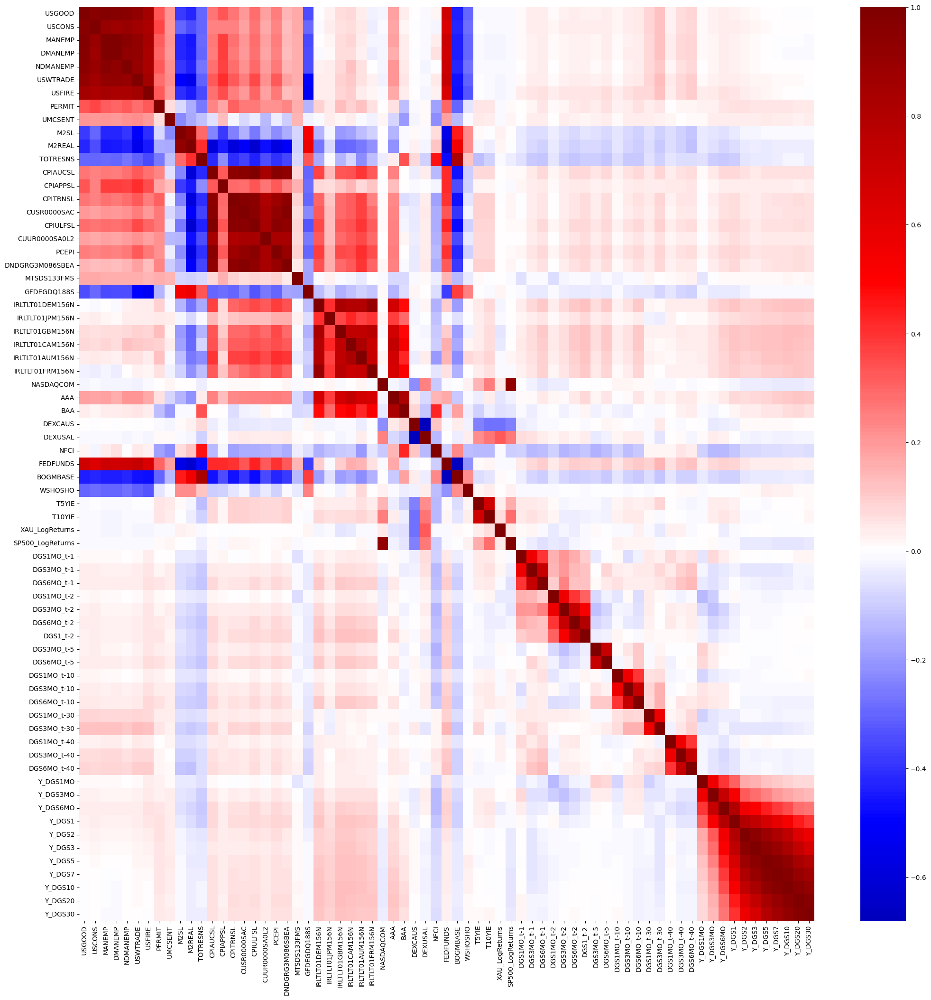

In [17]:
plt.figure(figsize=(25, 25))
sns.heatmap(dus_daily_filtered.corr(), cmap="seismic", center=0)

Let's analyze the results of a PCA on this dataset, setting the threshold to 0.95% of expalined variance.

In [18]:
scaler = StandardScaler()

X = dus_daily_filtered.drop(columns=Y)
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.95, random_state=SEED)
X_pca = pca.fit_transform(X_scaled)

print(
    f"The cumulative explained variance is:\n{pca.explained_variance_ratio_.cumsum()}"
)
print(
    f"It follows that {pca.n_components_} components are kept to explain 0.95 of the variance."
)

The cumulative explained variance is:
[0.20063178 0.30765502 0.37692745 0.43118364 0.47970699 0.52083965
 0.55851157 0.59130551 0.62189081 0.64949084 0.67587116 0.70135488
 0.72535087 0.74670924 0.76544079 0.78283976 0.79778514 0.81148186
 0.82468399 0.83765874 0.85015094 0.86229613 0.87367327 0.88420911
 0.89411451 0.90398253 0.91344715 0.920782   0.92783535 0.93410597
 0.93977142 0.94526377 0.9503372 ]
It follows that 33 components are kept to explain 0.95 of the variance.


Let's visualize the top features contribution to explain the variance of our daily dataset.

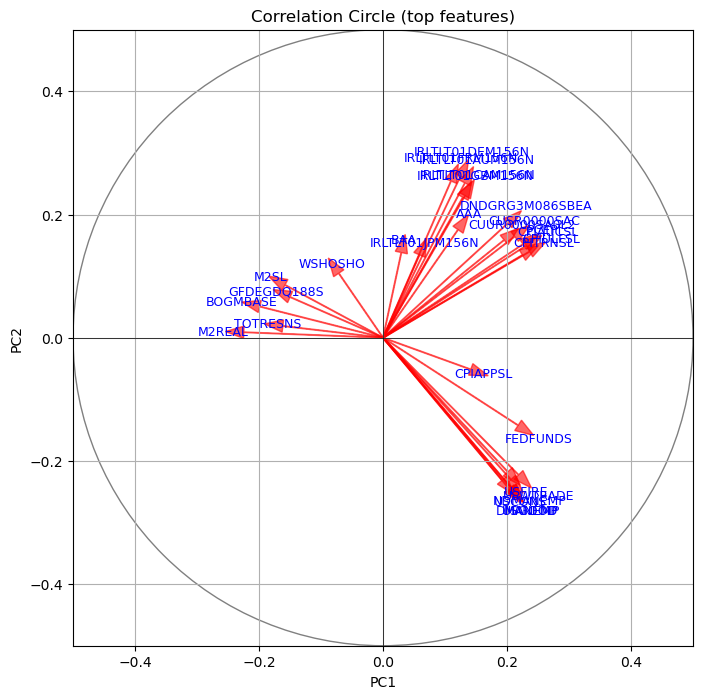

In [19]:
pc1, pc2 = np.abs(pca.components_[:2])
importance = pc1 + pc2

n = 30
top_idx = np.argsort(importance)[-n:]
top_labels = X.columns[top_idx]
top_components = pca.components_[:2, top_idx]

plt.figure(figsize=(8, 8))
circle = plt.Circle((0, 0), 0.5, color="gray", fill=False)
plt.gca().add_artist(circle)

for i, (x, y) in enumerate(zip(top_components[0, :], top_components[1, :])):
    plt.arrow(0, 0, x, y, color="r", alpha=0.6, head_width=0.02)
    plt.text(
        x * 1.15,
        y * 1.15,
        top_labels[i],
        color="b",
        ha="center",
        va="center",
        fontsize=9,
    )

plt.xlim(-0.5, 0.5)
plt.ylim(-0.5, 0.5)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Correlation Circle (top features)")
plt.grid()
plt.axhline(0, color="black", linewidth=0.5)
plt.axvline(0, color="black", linewidth=0.5)
plt.show()


#### Analysis of Principal Components & Feature Correlation

The correlation circle plot above visualizes the loadings of the 30 most significant features onto the first two principal components (PC1 and PC2), which together capture the largest sources of variance in our dataset.

The plot provides clear visual evidence of significant **multicollinearity**. We can observe several distinct, tightly-grouped clusters of variables:

* **Monetary Aggregates:** Features like `M2REAL`, `M2SL`, and `BOGMBASE` point in the same direction, indicating they are highly correlated and capture the same underlying "monetary base" factor.
* **Foreign Yields:** The 10-year yields of other major OECD countries (e.g., `IRLTLT01DEM156N`, `IRLTLT01JPM156N`) form another strong cluster.
* **Lagged Domestic Yields:** A large group of lagged yield features are bundled together, confirming the high serial correlation.
* **Inflation & Employment Components:** Sectoral breakdowns of inflation (e.g., `CPIAUCSL`, `CPIAPPSL`) and employment (e.g., `USWTRADE`, `USTRADE`) form their own respective clusters.

Given this high degree of collinearity, training a model on the raw features could lead to unstable coefficients and overfitting. Therefore, applying PCA as a preprocessing step is a well-justified method to reduce dimensionality and transform our correlated features into a more robust, orthogonal set of components.

### 3.2.2. Weekly Data

In [20]:
dus_weekly = dus_weekly.dropna()
dus_weekly.head()

,RPI,INDPRO,UNRATE,UEMP5TO14,PAYEMS,USGOOD,USCONS,MANEMP,DMANEMP,NDMANEMP,...,DCOILWTICO,FEDFUNDS,CURRCIR,BOGMBASE,WSHOSHO,WSHOTSL,T5YIE,T10YIE,XAU_LogReturns,SP500_LogReturns
2003-04-04,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.022277,0.007968,0.005315,0.006078,0.000906,0.000906,-0.01,-0.01,0.000983,0.002735
2003-04-11,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,0.038938,0.007968,0.005315,0.006078,0.005599,0.005600,-0.02,-0.02,0.005132,-0.003770
2003-04-18,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,0.031727,0.007968,0.005315,0.006078,0.002649,0.002649,0.00,0.00,0.002295,0.015416
2003-04-25,0.004111,-0.006278,0.016807,0.035964,-0.000484,-0.003744,0.005246,-0.007706,-0.008612,-0.006242,...,-0.059898,0.007968,0.005315,0.006078,0.000164,0.000164,0.00,0.02,-0.003593,-0.013943
2003-05-02,0.007335,-0.000344,0.016529,-0.011338,0.000184,-0.001327,0.002538,-0.003429,-0.003777,-0.002866,...,-0.011972,0.000000,0.005032,0.005761,0.000587,0.000587,0.04,0.00,-0.002050,0.014927


To enrich our feature set, we are engineering a comprehensive list of endogenous features based on the target's own history. This function generates several categories of predictors:

- Rolling Statistics: Captures the target's recent distribution (mean, std, range, and quantiles) over multiple windows (10, 20, and 50 weeks).

- Momentum & Value Signals: Creates normalized indicators like a rolling Z-score, a fast/slow moving average ratio (10-week vs. 50-week), and simple momentum.

- Raw Historical Lags: A sparse set of lagged values (e.g., t-1, t-2, t-5, ... t-50).

In [21]:
def create_lagged_features(df, columns, max_lag=20, windows=[10, 20, 50]):
    """
    Creates a DataFrame of lagged features from the original yield series.
    All features are shifted by 1 to prevent look-ahead bias.
    """
    all_features = {}

    for col in columns:
        y = df[col]

        # Rolling statistics (calculates up to t)
        for w in windows:
            roll = y.rolling(w)
            all_features[f"{col}_mean_{w}"] = roll.mean()
            all_features[f"{col}_std_{w}"] = roll.std()
            all_features[f"{col}_q25_{w}"] = roll.quantile(0.25)
            all_features[f"{col}_q75_{w}"] = roll.quantile(0.75)
            all_features[f"{col}_q05_{w}"] = roll.quantile(0.05)
            all_features[f"{col}_q90_{w}"] = roll.quantile(0.9)
            all_features[f"{col}_range_{w}"] = roll.max() - roll.min()

            # Z-score and momentum (both use y[t])
            all_features[f"{col}_zscore_{w}"] = (y - roll.mean()) / roll.std()
            all_features[f"{col}_momentum_{w}"] = y.diff(w)  # y[t] - y[t-w]

        # Ratio of fast / slow moving averages
        all_features[f"{col}_ratio_{10}_{50}"] = (
            y.rolling(10).mean() / y.rolling(50).mean()
        )

        # Approximate annualized volatility
        all_features[f"{col}_vol_20"] = y.rolling(20).std() * np.sqrt(52)

        # Raw lags (starts from y[t])
        # NOTE: The loop now starts at lag=0
        for lag in [0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 40, 50]:
            all_features[f"{col}_lag_{lag}"] = y.shift(lag)

    features = pd.DataFrame(all_features, index=df.index)

    # This makes all features at time 't' based on data from 't-1' or earlier.
    features_lagged = features.shift(1)

    return features_lagged

In [22]:
yield_cols = [
    "DGS1MO",
    "DGS3MO",
    "DGS6MO",
    "DGS1",
    "DGS2",
    "DGS3",
    "DGS5",
    "DGS7",
    "DGS10",
    "DGS20",
    "DGS30",
]

In [23]:
# Create  TARGETS (Y)
# Y at time 't' is the value from 't+1'
Y_weekly = pd.DataFrame(index=dus_weekly.index)
for col in yield_cols:
    Y_weekly[f"Y_{col}"] = dus_weekly[col].shift(-1)
Y_weekly.head()

,Y_DGS1MO,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30
2003-04-04,0.00,0.03,0.03,0.05,0.05,0.06,0.06,0.03,0.05,0.02,0.02
2003-04-11,-0.01,0.01,0.00,0.03,0.04,0.05,0.04,0.02,0.02,-0.01,-0.01
2003-04-18,0.00,-0.01,-0.01,-0.02,-0.05,-0.05,-0.04,-0.03,-0.02,-0.01,-0.01
2003-04-25,-0.02,0.02,0.03,0.06,0.06,0.07,0.08,0.08,0.06,0.04,0.04
2003-05-02,0.01,0.02,0.00,-0.02,-0.04,-0.01,-0.01,0.00,-0.01,-0.01,-0.01


In [24]:
# Create your FEATURES (X)
dus_weekly_features = create_lagged_features(dus_weekly, yield_cols)
dus_weekly_features.sample(5)

,DGS1MO_mean_10,DGS1MO_std_10,DGS1MO_q25_10,DGS1MO_q75_10,DGS1MO_q05_10,DGS1MO_q90_10,DGS1MO_range_10,DGS1MO_zscore_10,DGS1MO_momentum_10,DGS1MO_mean_20,...,DGS30_lag_3,DGS30_lag_4,DGS30_lag_5,DGS30_lag_10,DGS30_lag_15,DGS30_lag_20,DGS30_lag_25,DGS30_lag_30,DGS30_lag_40,DGS30_lag_50
2018-04-27,0.008,0.023476,-0.0075,0.0175,-0.0200,0.041,0.07,-1.192720e+00,-0.01,0.0040,...,-0.04,0.00,0.03,0.00,0.02,-0.07,-0.03,0.00,-0.01,-0.01
2020-07-17,-0.002,0.006325,-0.0075,0.0000,-0.0100,0.001,0.02,-1.264911e+00,-0.01,-0.0145,...,0.00,0.04,0.07,-0.01,-0.13,-0.07,0.03,-0.06,-0.03,-0.01
2008-10-17,-0.005,0.191848,-0.1050,-0.0075,-0.1710,0.139,0.67,-5.994337e-01,-0.09,-0.0280,...,0.22,0.12,0.00,-0.02,-0.09,-0.06,-0.03,-0.12,-0.01,0.02
2019-01-25,-0.010,0.019437,-0.0175,0.0000,-0.0400,0.011,0.06,-1.133485e-14,-0.01,-0.0055,...,-0.01,0.01,-0.02,-0.03,0.05,0.02,-0.01,0.00,-0.02,0.07
2009-08-14,-0.003,0.010593,-0.0100,0.0000,-0.0155,0.002,0.04,-6.607826e-01,-0.01,-0.0005,...,0.08,-0.11,-0.02,-0.20,0.09,0.03,0.21,0.00,0.05,0.00


In [25]:
# Align data
# This merges X[t-1] with Y[t] (which is the yield at t+1)
# The .dropna() removes:
#   a) NaNs from the start of the features (from rolling/lagging)
#   b) The final row(s) of Y_targets (which are NaN from the .shift(-1))
dus_weekly_augmented = (
    dus_weekly.merge(
        right=dus_weekly_features, how="left", left_index=True, right_index=True
    )
    .merge(right=Y_weekly, how="left", left_index=True, right_index=True)
    .dropna()
)
dus_weekly_augmented.head()

,RPI,INDPRO,UNRATE,UEMP5TO14,PAYEMS,USGOOD,USCONS,MANEMP,DMANEMP,NDMANEMP,...,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30
2004-03-26,0.003610,-0.003912,0.035091,-0.000821,0.002435,0.002992,0.007140,0.000560,0.000902,0.000000,...,0.02,0.01,0.07,0.21,0.27,0.28,0.28,0.24,0.20,0.12
2004-04-02,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,-0.02,0.00,0.01,0.01,0.01,0.03,0.02,0.02,0.02,-0.01
2004-04-09,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,-0.01,-0.04,-0.06,-0.07,-0.06,-0.06,-0.06,-0.05,-0.02,-0.02
2004-04-16,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,0.01,0.06,0.10,0.14,0.14,0.12,0.12,0.08,0.07,0.05
2004-04-23,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,0.01,0.02,0.00,-0.03,-0.02,-0.03,-0.03,-0.02,-0.02,-0.02


In [26]:
dus_weekly_augmented = dus_weekly_augmented.replace([np.inf, -np.inf], np.nan)
dus_weekly_augmented = dus_weekly_augmented.ffill()
dus_weekly_augmented.head()

,RPI,INDPRO,UNRATE,UEMP5TO14,PAYEMS,USGOOD,USCONS,MANEMP,DMANEMP,NDMANEMP,...,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30
2004-03-26,0.003610,-0.003912,0.035091,-0.000821,0.002435,0.002992,0.007140,0.000560,0.000902,0.000000,...,0.02,0.01,0.07,0.21,0.27,0.28,0.28,0.24,0.20,0.12
2004-04-02,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,-0.02,0.00,0.01,0.01,0.01,0.03,0.02,0.02,0.02,-0.01
2004-04-09,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,-0.01,-0.04,-0.06,-0.07,-0.06,-0.06,-0.06,-0.05,-0.02,-0.02
2004-04-16,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,0.01,0.06,0.10,0.14,0.14,0.12,0.12,0.08,0.07,0.05
2004-04-23,0.003221,0.003871,-0.035091,-0.014067,0.002080,0.002020,0.002031,0.001958,0.002926,0.000369,...,0.01,0.02,0.00,-0.03,-0.02,-0.03,-0.03,-0.02,-0.02,-0.02


To reduce dimensionality and noise, we are removing features with a weak linear relationship to the target. All predictors with an absolute correlation coefficient below 0.1 are filtered out from the feature set.

In [27]:
# Create weekly features dataset by dropping the target columns
Xw = dus_weekly_augmented.drop(columns=Y_weekly.columns)

# Align target dataset index witht Xw
Y_weekly = Y_weekly.reindex(Xw.index)
Y_weekly.head()

,Y_DGS1MO,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30
2004-03-26,-0.02,0.02,0.01,0.07,0.21,0.27,0.28,0.28,0.24,0.20,0.12
2004-04-02,-0.01,-0.02,0.00,0.01,0.01,0.01,0.03,0.02,0.02,0.02,-0.01
2004-04-09,-0.01,-0.01,-0.04,-0.06,-0.07,-0.06,-0.06,-0.06,-0.05,-0.02,-0.02
2004-04-16,0.06,0.01,0.06,0.10,0.14,0.14,0.12,0.12,0.08,0.07,0.05
2004-04-23,-0.02,0.01,0.02,0.00,-0.03,-0.02,-0.03,-0.03,-0.02,-0.02,-0.02


In [28]:
corrs = pd.DataFrame(
    {target: Xw.corrwith(Y_weekly[target]) for target in Y_weekly.columns}
).abs()

mask = (corrs < 0.1).all(axis=1)
low_corr_features = corrs.index[mask]

Xw_filtered = Xw.drop(columns=low_corr_features)

print(f"{len(low_corr_features)} features were deleted, namely:\n{low_corr_features}")

441 features were deleted, namely:
Index(['RPI', 'INDPRO', 'UNRATE', 'UEMP5TO14', 'PAYEMS', 'USGOOD', 'USCONS',
       'MANEMP', 'DMANEMP', 'NDMANEMP',
       ...
       'DGS30_lag_3', 'DGS30_lag_4', 'DGS30_lag_5', 'DGS30_lag_10',
       'DGS30_lag_15', 'DGS30_lag_20', 'DGS30_lag_25', 'DGS30_lag_30',
       'DGS30_lag_40', 'DGS30_lag_50'],
      dtype='object', length=441)


<Axes: >

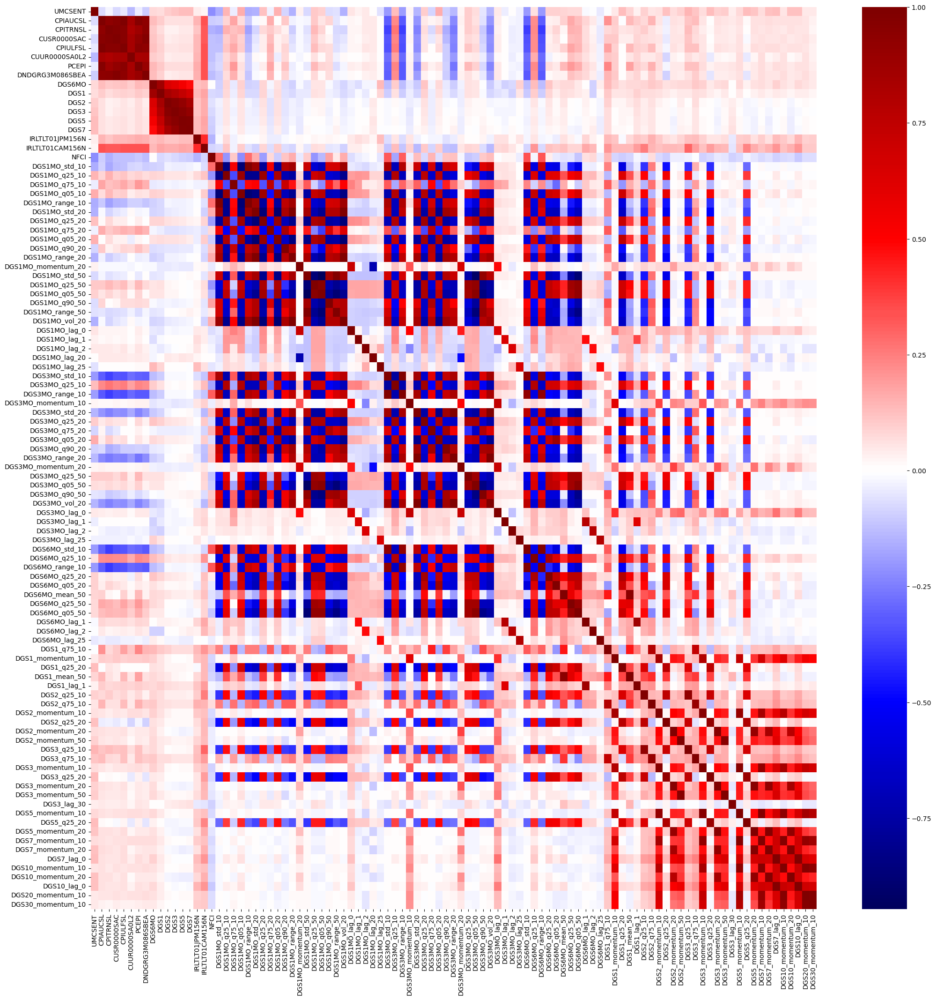

In [29]:
plt.figure(figsize=(25, 25))
sns.heatmap(Xw_filtered.corr(), cmap="seismic", center=0)

### 3.2.2. Weekly Data for Binary Classification

Since there will also be be binary classifaction models, let's prepare the targets for that matter. Note that the classification targets are directions: does the yield go up or down from one time point to another.

In [30]:
Y_weekly

,Y_DGS1MO,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30
2004-03-26,-0.02,0.02,0.01,0.07,0.21,0.27,0.28,0.28,0.24,0.20,0.12
2004-04-02,-0.01,-0.02,0.00,0.01,0.01,0.01,0.03,0.02,0.02,0.02,-0.01
2004-04-09,-0.01,-0.01,-0.04,-0.06,-0.07,-0.06,-0.06,-0.06,-0.05,-0.02,-0.02
2004-04-16,0.06,0.01,0.06,0.10,0.14,0.14,0.12,0.12,0.08,0.07,0.05
2004-04-23,-0.02,0.01,0.02,0.00,-0.03,-0.02,-0.03,-0.03,-0.02,-0.02,-0.02
...,...,...,...,...,...,...,...,...,...,...,...
2024-11-29,-0.02,-0.04,-0.04,-0.04,-0.05,-0.05,-0.04,-0.03,-0.02,-0.01,0.01
2024-12-06,0.00,-0.01,0.01,0.02,0.07,0.07,0.07,0.08,0.08,0.07,0.06
2024-12-13,0.01,-0.01,0.00,-0.01,-0.02,-0.03,-0.06,-0.06,-0.05,-0.03,-0.02
2024-12-20,-0.01,-0.04,-0.02,-0.03,0.01,0.01,0.03,0.04,0.04,0.06,0.06


In [31]:
Yw_binary = (Y_weekly > 0).astype(int)
Xw = dus_weekly_augmented.drop(columns=Yw_binary.columns)

Our feature engineering process on the yield time series resulted in a high-dimensional dataset. To mitigate the risk of overfitting and the curse of dimensionality, a robust feature selection step is essential. We will employ a filter-based method using Mutual Information (MI), which is great at capturing non-linear relationships that simple correlation might miss.

To determine the optimal feature set, we will create several distinct subsets of the data. Each subset will contain only those features with an MI score above a specific threshold. We will test a range of thresholds—namely 0.03, 0.035, 0.04, and 0.05—and train our predictive models on each of these datasets to evaluate which level of parsimony yields the best out-of-sample performance.

In [32]:
initial_number_of_features = Xw.shape[1]

threshold_list = [0.03, 0.035, 0.04, 0.05]

datasets = {t: pd.DataFrame() for t in threshold_list}

for threshold_mi in tqdm(threshold_list):
    selected_features_w = set()
    for col in Yw_binary.columns:
        mi = mutual_info_classif(Xw, Yw_binary[col], random_state=SEED)
        top_features_i = Xw.columns[mi > threshold_mi]
        selected_features_w.update(top_features_i)

    datasets[threshold_mi] = Xw[list(selected_features_w)]

    print(
        f"{initial_number_of_features - len(selected_features_w)} features were removed for threshold {threshold_mi}."
    )
    print(
        f"So that {datasets[threshold_mi].shape[1]} features are left for that threshold {threshold_mi}."
    )
    print(
        f"Features that are left, bar target related ones, are\
        \n{[col for col in datasets[threshold_mi].columns if not col.startswith(('Y', 'DGS'))]}."
    )

 25%|██▌       | 1/4 [00:06<00:19,  6.51s/it]

292 features were removed for threshold 0.03.
So that 248 features are left for that threshold 0.03.
Features that are left, bar target related ones, are        
['GFDEGDQ188S', 'INDPRO', 'USGOOD', 'M1SL', 'USWTRADE', 'GFDEBTN', 'M2SL', 'UMCSENT', 'FGEXPND', 'BOGMBASE', 'TOTRESNS', 'IRLTLT01GBM156N', 'SRVPRD', 'UEMP5TO14', 'CPIAUCSL', 'FGDEF', 'NONREVSL', 'IRLTLT01AUM156N', 'IRLTLT01CAM156N', 'DTCTHFNM', 'DNDGRG3M086SBEA', 'IRLTLT01DEM156N', 'MTSDS133FMS', 'CUSR0000SAC', 'FYGFDPUN', 'CPIULFSL', 'FEDFUNDS', 'UNRATE', 'PERMIT', 'NDMANEMP', 'HOUST', 'DCOILWTICO', 'CPITRNSL', 'WSHOTSL', 'CUUR0000SA0L2', 'CURRCIR', 'CUUR0000SAD', 'USTRADE', 'MANEMP', 'RPI', 'DTCOLNVHFNM', 'PAYEMS', 'M2REAL', 'DMANEMP', 'USGOVT', 'PCEPI', 'USTPU', 'CPIAPPSL', 'USFIRE', 'USCONS'].


 50%|█████     | 2/4 [00:13<00:13,  6.56s/it]

355 features were removed for threshold 0.035.
So that 185 features are left for that threshold 0.035.
Features that are left, bar target related ones, are        
['GFDEGDQ188S', 'INDPRO', 'USGOOD', 'M1SL', 'USWTRADE', 'GFDEBTN', 'M2SL', 'UMCSENT', 'FGEXPND', 'BOGMBASE', 'TOTRESNS', 'IRLTLT01GBM156N', 'SRVPRD', 'UEMP5TO14', 'CPIAUCSL', 'FGDEF', 'NONREVSL', 'IRLTLT01AUM156N', 'IRLTLT01CAM156N', 'DTCTHFNM', 'DNDGRG3M086SBEA', 'IRLTLT01DEM156N', 'MTSDS133FMS', 'CUSR0000SAC', 'FYGFDPUN', 'CPIULFSL', 'FEDFUNDS', 'UNRATE', 'PERMIT', 'NDMANEMP', 'HOUST', 'DCOILWTICO', 'CPITRNSL', 'CUUR0000SA0L2', 'CURRCIR', 'CUUR0000SAD', 'USTRADE', 'MANEMP', 'RPI', 'DTCOLNVHFNM', 'PAYEMS', 'M2REAL', 'DMANEMP', 'USGOVT', 'PCEPI', 'USTPU', 'CPIAPPSL', 'USFIRE', 'USCONS'].


 75%|███████▌  | 3/4 [00:19<00:06,  6.59s/it]

401 features were removed for threshold 0.04.
So that 139 features are left for that threshold 0.04.
Features that are left, bar target related ones, are        
['GFDEGDQ188S', 'INDPRO', 'USGOOD', 'M1SL', 'USWTRADE', 'GFDEBTN', 'M2SL', 'UMCSENT', 'FGEXPND', 'BOGMBASE', 'TOTRESNS', 'IRLTLT01GBM156N', 'SRVPRD', 'UEMP5TO14', 'CPIAUCSL', 'FGDEF', 'NONREVSL', 'IRLTLT01AUM156N', 'IRLTLT01CAM156N', 'DTCTHFNM', 'DNDGRG3M086SBEA', 'IRLTLT01DEM156N', 'MTSDS133FMS', 'CUSR0000SAC', 'FYGFDPUN', 'CPIULFSL', 'FEDFUNDS', 'UNRATE', 'PERMIT', 'NDMANEMP', 'HOUST', 'DCOILWTICO', 'CPITRNSL', 'CUUR0000SA0L2', 'CURRCIR', 'CUUR0000SAD', 'USTRADE', 'MANEMP', 'RPI', 'DTCOLNVHFNM', 'PAYEMS', 'M2REAL', 'DMANEMP', 'USGOVT', 'PCEPI', 'USTPU', 'CPIAPPSL', 'USFIRE', 'USCONS'].


100%|██████████| 4/4 [00:26<00:00,  6.61s/it]

459 features were removed for threshold 0.05.
So that 81 features are left for that threshold 0.05.
Features that are left, bar target related ones, are        
['GFDEGDQ188S', 'INDPRO', 'USGOOD', 'M1SL', 'USWTRADE', 'GFDEBTN', 'M2SL', 'UMCSENT', 'FGEXPND', 'BOGMBASE', 'TOTRESNS', 'IRLTLT01GBM156N', 'SRVPRD', 'UEMP5TO14', 'CPIAUCSL', 'FGDEF', 'NONREVSL', 'IRLTLT01AUM156N', 'IRLTLT01CAM156N', 'DTCTHFNM', 'DNDGRG3M086SBEA', 'IRLTLT01DEM156N', 'MTSDS133FMS', 'CUSR0000SAC', 'FYGFDPUN', 'CPIULFSL', 'FEDFUNDS', 'PERMIT', 'NDMANEMP', 'HOUST', 'CPITRNSL', 'CUUR0000SA0L2', 'CURRCIR', 'CUUR0000SAD', 'USTRADE', 'MANEMP', 'RPI', 'DTCOLNVHFNM', 'PAYEMS', 'M2REAL', 'USGOVT', 'DMANEMP', 'PCEPI', 'USTPU', 'CPIAPPSL', 'USFIRE', 'USCONS'].


The feature selection process revealed that many of the macroeconomic and market variables sourced from FRED had low Mutual Information (MI) scores with our target. As a result, applying the MI threshold filtered out a significant portion of these exogenous features, suggesting they have a weak predictive relationship with yield directions.

# 4. Methodology and Model Design

# 4.1 Regressions on Daily Dataset

### Methodology: Regularized Linear Models

To establish a robust baseline for our forecasts, we first implement a suite of regularized linear models. This model class is well-suited for high-dimensional, noisy financial data as it is designed to prevent overfitting and perform implicit feature selection.

We will test three classic regularization techniques:
* **Ridge Regression (L2 penalty):** Shrinks all feature coefficients toward zero, which is highly effective at handling multicollinearity.
* **Lasso Regression (L1 penalty):** Shrinks less important feature coefficients to be *exactly* zero, performing automatic feature selection.
* **ElasticNet (L1 + L2 penalty):** A hybrid model that combines the strengths of both Ridge and Lasso, useful when many features are correlated.

#### Backtesting Framework
All models are evaluated using a **rolling-window (walk-forward) validation** to simulate a realistic out-of-sample trading environment. The framework is as follows:

1.  **Window Sizing:** A training window of 4 or 10 years (1008 or 2520 days) is used to predict the subsequent 21-day (1-month) forecast horizon.
2.  **Rolling:** The window is rolled forward by 21 days, and the process is repeated.
3.  **Hyperparameter Tuning:** To avoid data leakage, hyperparameters (`alpha` and `l1_ratio`) are tuned *inside* each training window. We use the `MultiTaskLassoCV` and `MultiTaskElasticNetCV` (and `RidgeCV`) models, which perform this tuning efficiently using an inner `TimeSeriesSplit`.

#### Experimental Comparison
Our primary experiment for this section is to compare two distinct preprocessing pipelines for each model:

1.  **Model (No PCA):** `StandardScaler` $\rightarrow$ `Model`
2.  **Model (With PCA):** `StandardScaler` $\rightarrow$ `PCA(n_components=0.95)` $\rightarrow$ `Model`

This comparison will allow us to determine if explicitly handling multicollinearity and reducing dimensionality with PCA improves the out-of-sample performance and stability of the regularized models. Performance will be measured using OOS R-squared (R²), directional accuracy (hit rate), and the number of features selected by the Lasso/ElasticNet models.

### 4.1.1. Ridge Regression

In [60]:
# Define Backtest Configuration

# Define the rolling window parameters
TRAIN_WINDOW_SIZE = 252 * 4  # 4 years of daily data (1008)
FORECAST_HORIZON = 21  # 21 days (approx. 1 month)

# Define the RidgeCV hyperparameter grid
RIDGE_ALPHAS = np.logspace(-3, 3, 20)

# Define the inner-loop cross-validator for RidgeCV
INNER_LOOP_CV = TimeSeriesSplit(n_splits=4)

In [61]:
# Define Model Pipelines

model_pipelines = {
    "Ridge_PCA": Pipeline(
        [
            ("scaler", StandardScaler()),
            ("pca", PCA(n_components=0.95, random_state=SEED)),  # Retain 95% of variance
            (
                "ridge",
                MultiOutputRegressor(
                    RidgeCV(alphas=RIDGE_ALPHAS, cv=INNER_LOOP_CV, fit_intercept=False)
                ),
            ),
        ]
    ),
    "Ridge_NoPCA": Pipeline(
        [
            ("scaler", StandardScaler()),
            (
                "ridge",
                MultiOutputRegressor(
                    RidgeCV(alphas=RIDGE_ALPHAS, cv=INNER_LOOP_CV, fit_intercept=False)
                ),
            ),
        ]
    ),
}

In [62]:
# Define Backtest Helper Function

def run_backtest_fold(model, X_train, Y_train, X_test, Y_test):
    """
    Fits a model on the training fold, predicts the test fold,
    and returns all relevant predictions and performance metrics.
    """
    # Fit the model pipeline
    model.fit(X_train, Y_train)

    # Generate in-sample (IS) and out-of-sample (OOS) predictions
    Y_pred_is = model.predict(X_train)
    Y_pred_oos = model.predict(X_test)

    # Calculate performance metrics
    r2_is = r2_score(Y_train, Y_pred_is, multioutput="raw_values")
    r2_oos = r2_score(Y_test, Y_pred_oos, multioutput="raw_values")

    # Calculate directional accuracy (hit rate)
    hit_rate = np.mean(np.sign(Y_test.values) == np.sign(Y_pred_oos), axis=0)

    # Store results in a structured dictionary
    fold_results = {
        "r2_in_sample": r2_is,
        "r2_out_of_sample": r2_oos,
        "hit_rate": hit_rate,
        "predictions": Y_pred_oos,
        "target_dates": X_test.index,
    }

    return fold_results

In [274]:
# Execute the Rolling Window Backtest

# Initialize a nested dictionary to store all results
backtest_results = {model_name: [] for model_name in model_pipelines.keys()}

# Define the total number of steps in the backtest
total_steps = len(X) - TRAIN_WINDOW_SIZE - FORECAST_HORIZON + 1

for start_idx in tqdm(range(0, total_steps, FORECAST_HORIZON)):
    # Define window indices
    train_end_idx = start_idx + TRAIN_WINDOW_SIZE
    test_end_idx = train_end_idx + FORECAST_HORIZON

    # Slice data for the current fold
    X_train = X.iloc[start_idx:train_end_idx]
    Y_train = Y.iloc[start_idx:train_end_idx]
    X_test = X.iloc[train_end_idx:test_end_idx]
    Y_test = Y.iloc[train_end_idx:test_end_idx]

    # Iterate through each defined model
    for model_name, pipeline in model_pipelines.items():
        # Run the evaluation for this fold
        results = run_backtest_fold(pipeline, X_train, Y_train, X_test, Y_test)

        backtest_results[model_name].append(results)

print("Backtest complete.")

100%|██████████| 210/210 [03:04<00:00,  1.14it/s]

Backtest complete.


In [292]:
# Helper Function to Process Backtest Results


def extract_metric_dataframe(
    backtest_results, model_name, metric_key, target_columns=None
):
    """
    Extracts a specific metric from the backtest_results dictionary
    and returns it as a DataFrame.

    Args:
        backtest_results (dict): The main dictionary holding all fold results.
        model_name (str): The key for the model (e.g., 'Ridge_PCA').
        metric_key (str): The key for the metric (e.g., 'r2_out_of_sample').
        target_columns (pd.Index): The column names of the original Y DataFrame.

    Returns:
        pd.DataFrame: A DataFrame where each row is a fold and columns are targets.
    """
    results_list = backtest_results[model_name]
    metric_data = [fold[metric_key] for fold in results_list]
    fold_indices = [fold["target_dates"][0] for fold in results_list]

    # Handle multi-output metrics (like R2) vs. single-value metrics (like alpha)
    if target_columns is not None and isinstance(metric_data[0], (np.ndarray, list)):
        df = pd.DataFrame(metric_data, columns=target_columns, index=fold_indices)
    else:
        # This handles single-value metrics (like alpha)
        df = pd.DataFrame(metric_data, columns=[metric_key], index=fold_indices)

    df.index.name = "Prediction_Start_Date"
    return df

In [279]:
# Extract All Metrics into DataFrames

target_cols = Y.columns

# In-Sample R2
r2_is_df = extract_metric_dataframe(
    backtest_results, "Ridge_PCA", "r2_in_sample", target_cols
)
r2_is_df_nopca = extract_metric_dataframe(
    backtest_results, "Ridge_NoPCA", "r2_in_sample", target_cols
)

# Out-of-Sample R2
r2_os_df = extract_metric_dataframe(
    backtest_results, "Ridge_PCA", "r2_out_of_sample", target_cols
)
r2_os_df_nopca = extract_metric_dataframe(
    backtest_results, "Ridge_NoPCA", "r2_out_of_sample", target_cols
)

# Hit Rate
hr_df = extract_metric_dataframe(backtest_results, "Ridge_PCA", "hit_rate", target_cols)
hr_df_nopca = extract_metric_dataframe(
    backtest_results, "Ridge_NoPCA", "hit_rate", target_cols
)

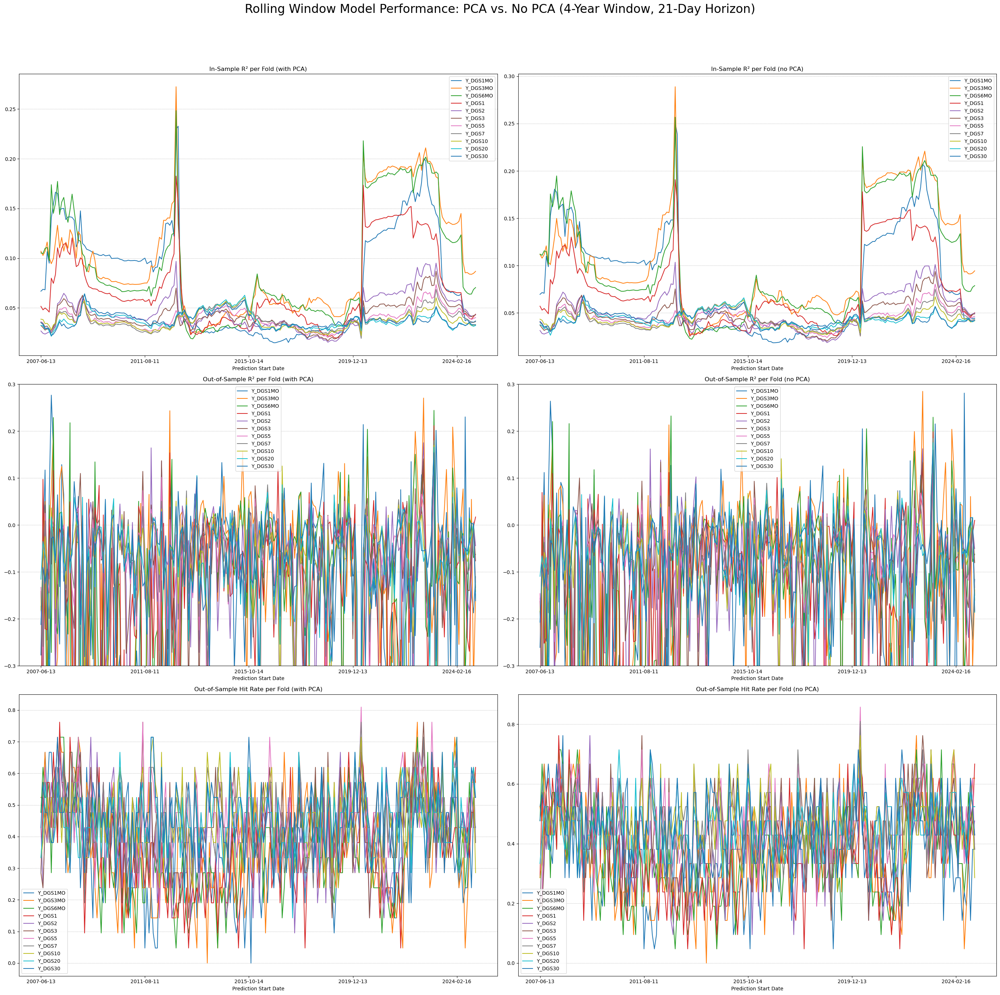

In [280]:
# Create the Visualization Grid

plt.close("all")  # Close any existing figures
fig, axes = plt.subplots(3, 2, figsize=(28, 28))

plot_config = [
    {
        "df": r2_is_df,
        "ax": axes[0, 0],
        "title": "In-Sample R² per Fold (with PCA)",
        "ylim": None,
    },
    {
        "df": r2_is_df_nopca,
        "ax": axes[0, 1],
        "title": "In-Sample R² per Fold (no PCA)",
        "ylim": None,
    },
    {
        "df": r2_os_df,
        "ax": axes[1, 0],
        "title": "Out-of-Sample R² per Fold (with PCA)",
        "ylim": (-0.3, 0.3),
    },
    {
        "df": r2_os_df_nopca,
        "ax": axes[1, 1],
        "title": "Out-of-Sample R² per Fold (no PCA)",
        "ylim": (-0.3, 0.3),
    },
    {
        "df": hr_df,
        "ax": axes[2, 0],
        "title": "Out-of-Sample Hit Rate per Fold (with PCA)",
        "ylim": None,
    },
    {
        "df": hr_df_nopca,
        "ax": axes[2, 1],
        "title": "Out-of-Sample Hit Rate per Fold (no PCA)",
        "ylim": None,
    },
]

for config in plot_config:
    config["df"].plot(ax=config["ax"], title=config["title"], legend=True)
    config["ax"].set_xlabel("Prediction Start Date")
    config["ax"].grid(True, axis="y", linestyle="--", linewidth=0.5)
    if config["ylim"]:
        config["ax"].set_ylim(config["ylim"])

fig.suptitle(
    "Rolling Window Model Performance: PCA vs. No PCA (4-Year Window, 21-Day Horizon)",
    fontsize=24,
    y=1.02,
)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

#### Analysis of Rolling-Window Lasso Performance

Our analysis of the rolling-window backtest for the RidgeCV models (with and without PCA) yields several findings regarding in-sample fit and out-of-sample predictive power.

#### In-Sample Performance (R²)

The in-sample R-squared (IS R²) is low across all maturities, indicating that the selected features explain only a small fraction of the variance in yields. This explanatory power is not uniform across the curve; the model demonstrates a modest fit for short-term yields (1-month to 1-year) which deteriorates significantly for long-term maturities.

Furthermore, the IS R² is highly unstable over time. We observe significant variations in model fit during the rolling windows, particularly around 2011 and 2020. This suggests the model's coefficients are sensitive to outliers and structural breaks within the training data.

#### Out-of-Sample Performance (R² and Hit Rate)

The out-of-sample (OOS) R-squared provides the true test of predictive skill. Across all target maturities, the OOS R² is consistently near-zero or negative. This result signifies a complete lack of predictive power; the model fails to outperform a simple historical mean forecast.

This failure is confirmed by the directional accuracy (hit rate), which averages approximately 0.5. This result is statistically indistinguishable from a random guess (a coin flip), indicating the model has no discernible skill in predicting the *direction* of future yield changes.

#### Effect of PCA and Conclusion

Introducing PCA into the pipeline did not produce any meaningful change in the in-sample R². While we did observe that the hit rate became slightly less variable when using PCA, suggesting a minor reduction in model variance, the overall out-of-sample results were equally poor.

**Conclusion:** The combination of a modest in-sample fit with non-existent out-of-sample performance (negative OOS R² and a ~0.5 hit rate) points to a classic case of overfitting. The model is fitting to noise within the training window but fails to generalize or capture any durable, predictive relationships.

### 4.1.2. Lasso Regression

In [284]:
# Define the LassoCV hyperparameter grid
LASSO_ALPHAS = np.logspace(-5, 2, 20)

In [ ]:
INNER_LOOP_CV_LASSO = TimeSeriesSplit(n_splits=4)

In [ ]:
# Define Model Pipelines

model_pipelines = {
    "Lasso_PCA": Pipeline(
        [
            ("scaler", StandardScaler()),
            ("pca", PCA(n_components=0.95, random_state=SEED)),
            (
                "lasso",
                MultiTaskLassoCV(
                    fit_intercept=False,
                    alphas=LASSO_ALPHAS,
                    cv=INNER_LOOP_CV,
                    max_iter=5000,
                    tol=1e-3,
                    random_state=SEED,
                ),
            ),
        ]
    ),
    "Lasso_NoPCA": Pipeline(
        [
            ("scaler", StandardScaler()),
            (
                "lasso",
                MultiTaskLassoCV(
                    fit_intercept=False,
                    alphas=LASSO_ALPHAS,
                    cv=INNER_LOOP_CV,
                    max_iter=5000,
                    tol=1e-3,
                    random_state=SEED,
                ),
            ),
        ]
    ),
}

In [309]:
# Define Backtest Helper Function for Lasso Regression
def run_backtest_fold_lasso(model, X_train, Y_train, X_test, Y_test):
    """
    Fits a Lasso pipeline on the training fold, predicts the test fold,
    and returns all relevant predictions and performance metrics.
    """
    # Fit the model pipeline
    model.fit(X_train, Y_train)

    # Generate in-sample (IS) and out-of-sample (OOS) predictions
    Y_pred_is = model.predict(X_train)
    Y_pred_oos = model.predict(X_test)

    # Calculate Performance Metrics
    r2_is = r2_score(Y_train, Y_pred_is, multioutput="raw_values")
    r2_oos = r2_score(Y_test, Y_pred_oos, multioutput="raw_values")
    hit_rate = np.mean(np.sign(Y_test.values) == np.sign(Y_pred_oos), axis=0)

    # Extract Lasso-Specific Metrics
    lasso_estimator = model.named_steps["lasso"]

    coefs = lasso_estimator.coef_

    # Count features that are non-zero for *at least one* target
    n_features_selected = np.sum(np.any(coefs != 0, axis=0))

    fold_results = {
        "r2_in_sample": r2_is,
        "r2_out_of_sample": r2_oos,
        "hit_rate": hit_rate,
        "selected_alpha": lasso_estimator.alpha_,
        "n_features_selected": n_features_selected,
        "predictions": Y_pred_oos,
        "target_dates": X_test.index,
    }

    return fold_results

In [ ]:
# Execute the Rolling Window Backtest

backtest_results = {model_name: [] for model_name in model_pipelines.keys()}

total_steps = len(X) - TRAIN_WINDOW_SIZE - FORECAST_HORIZON + 1

for start_idx in tqdm(range(0, total_steps, FORECAST_HORIZON)):
    # Define window indices
    train_end_idx = start_idx + TRAIN_WINDOW_SIZE
    test_end_idx = train_end_idx + FORECAST_HORIZON

    # Slice data for the current fold
    X_train = X.iloc[start_idx:train_end_idx]
    Y_train = Y.iloc[start_idx:train_end_idx]
    X_test = X.iloc[train_end_idx:test_end_idx]
    Y_test = Y.iloc[train_end_idx:test_end_idx]

    # Iterate through each defined model
    for model_name, pipeline in model_pipelines.items():
        # Run the evaluation for this fold
        results = run_backtest_fold_lasso(pipeline, X_train, Y_train, X_test, Y_test)

        backtest_results[model_name].append(results)

print("Backtest complete.")

In [293]:
# Extract all 10 metric DataFrames

target_cols = Y.columns
r2_is_df = extract_metric_dataframe(
    backtest_results, "Lasso_PCA", "r2_in_sample", target_cols
)
r2_is_df_nopca = extract_metric_dataframe(
    backtest_results, "Lasso_NoPCA", "r2_in_sample", target_cols
)
r2_os_df = extract_metric_dataframe(
    backtest_results, "Lasso_PCA", "r2_out_of_sample", target_cols
)
r2_os_df_nopca = extract_metric_dataframe(
    backtest_results, "Lasso_NoPCA", "r2_out_of_sample", target_cols
)
hr_df = extract_metric_dataframe(backtest_results, "Lasso_PCA", "hit_rate", target_cols)
hr_df_nopca = extract_metric_dataframe(
    backtest_results, "Lasso_NoPCA", "hit_rate", target_cols
)
fs_df = extract_metric_dataframe(backtest_results, "Lasso_PCA", "n_features_selected")
fs_df_nopca = extract_metric_dataframe(
    backtest_results, "Lasso_NoPCA", "n_features_selected"
)
alpha_df = extract_metric_dataframe(backtest_results, "Lasso_PCA", "selected_alpha")
alpha_df_nopca = extract_metric_dataframe(
    backtest_results, "Lasso_NoPCA", "selected_alpha"
)

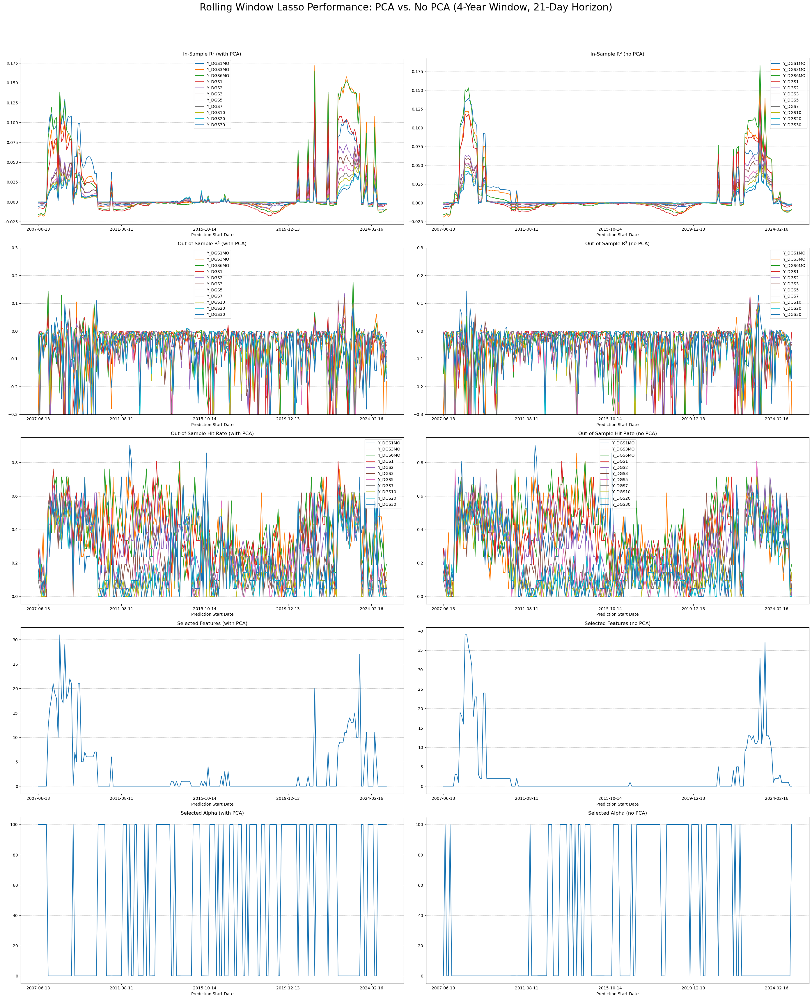

In [294]:
# Create the Visualization Grid

plt.close("all")
fig, axes = plt.subplots(5, 2, figsize=(28, 35))  # Increased height for 5 rows
fig.suptitle(
    "Rolling Window Lasso Performance: PCA vs. No PCA (4-Year Window, 21-Day Horizon)",
    fontsize=24,
    y=1.01,
)

plot_config = [
    {
        "df": r2_is_df,
        "ax": axes[0, 0],
        "title": "In-Sample R² (with PCA)",
        "ylim": None,
    },
    {
        "df": r2_is_df_nopca,
        "ax": axes[0, 1],
        "title": "In-Sample R² (no PCA)",
        "ylim": None,
    },
    {
        "df": r2_os_df,
        "ax": axes[1, 0],
        "title": "Out-of-Sample R² (with PCA)",
        "ylim": (-0.3, 0.3),
    },
    {
        "df": r2_os_df_nopca,
        "ax": axes[1, 1],
        "title": "Out-of-Sample R² (no PCA)",
        "ylim": (-0.3, 0.3),
    },
    {
        "df": hr_df,
        "ax": axes[2, 0],
        "title": "Out-of-Sample Hit Rate (with PCA)",
        "ylim": None,
    },
    {
        "df": hr_df_nopca,
        "ax": axes[2, 1],
        "title": "Out-of-Sample Hit Rate (no PCA)",
        "ylim": None,
    },
    {
        "df": fs_df,
        "ax": axes[3, 0],
        "title": "Selected Features (with PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": fs_df_nopca,
        "ax": axes[3, 1],
        "title": "Selected Features (no PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": alpha_df,
        "ax": axes[4, 0],
        "title": "Selected Alpha (with PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": alpha_df_nopca,
        "ax": axes[4, 1],
        "title": "Selected Alpha (no PCA)",
        "ylim": None,
        "legend": False,
    },
]

for config in plot_config:
    show_legend = config.get("legend", True)  # Show legend by default
    config["df"].plot(ax=config["ax"], title=config["title"], legend=show_legend)
    config["ax"].set_xlabel("Prediction Start Date")
    config["ax"].grid(True, axis="y", linestyle="--", linewidth=0.5)
    if config["ylim"]:
        config["ax"].set_ylim(config["ylim"])

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

The Lasso (L1) regression yielded results inferior to the Ridge (L2) model. This underperformance is directly attributable to the instability of its feature-selection mechanism. In numerous rolling-window periods, the LassoCV failed to converge on a useful subset of predictors, instead selecting a regularization strength (alpha) that set all feature coefficients to zero.

This all-or-nothing sparsity is far more detrimental in a low signal-to-noise environment than Ridge's L2 approach. By only shrinking coefficients, Ridge avoids this specific mode of model failure and provides a more consistent, non-zero forecast.

### 4.1.3. ElasticNet Regression

In [402]:
# Define the ElasticNetCV hyperparameter grid

ELASTIC_NET_ALPHAS = np.logspace(-3, 2, 20)
L1_RATIOS = [0.25, 0.5, 0.75]

In [ ]:
# Define Model Pipelines

model_pipelines = {
    "ElasticNet_PCA": Pipeline(
        [
            ("scaler", StandardScaler()),
            ("pca", PCA(n_components=0.95, random_state=SEED)),
            (
                "elasticnet",
                MultiTaskElasticNetCV(
                    alphas=ELASTIC_NET_ALPHAS,
                    cv=INNER_LOOP_CV,
                    l1_ratio=L1_RATIOS,
                    fit_intercept=False,
                    max_iter=5000,
                    random_state=SEED,
                ),
            ),
        ]
    ),
    "ElasticNet_NoPCA": Pipeline(
        [
            ("scaler", StandardScaler()),
            (
                "elasticnet",
                MultiTaskElasticNetCV(
                    alphas=ELASTIC_NET_ALPHAS,
                    cv=INNER_LOOP_CV,
                    l1_ratio=L1_RATIOS,
                    fit_intercept=False,
                    max_iter=5000,
                    random_state=SEED,
                ),
            ),
        ]
    ),
}

In [303]:
# Define Backtest Helper Function


def run_backtest_fold_elasticnet(model, X_train, Y_train, X_test, Y_test):
    """
    Fits an ElasticNet pipeline on the training fold, predicts the test fold,
    and returns all relevant predictions and performance metrics.
    """

    model.fit(X_train, Y_train)

    # Generate in-sample (IS) and out-of-sample (OOS) predictions
    Y_pred_is = model.predict(X_train)
    Y_pred_oos = model.predict(X_test)

    # Calculate Performance Metrics
    r2_is = r2_score(Y_train, Y_pred_is, multioutput="raw_values")
    r2_oos = r2_score(Y_test, Y_pred_oos, multioutput="raw_values")
    hit_rate = np.mean(np.sign(Y_test.values) == np.sign(Y_pred_oos), axis=0)

    # Extract ElasticNet-Specific Metrics
    elasticnet_estimator = model.named_steps["elasticnet"]

    coefs = elasticnet_estimator.coef_

    # Count features that are non-zero for *at least one* target
    n_features_selected = np.sum(np.any(coefs != 0, axis=0))

    fold_results = {
        "r2_in_sample": r2_is,
        "r2_out_of_sample": r2_oos,
        "hit_rate": hit_rate,
        "selected_alpha": elasticnet_estimator.alpha_,
        "selected_l1_ratio": elasticnet_estimator.l1_ratio_,
        "n_features_selected": n_features_selected,
        "predictions": Y_pred_oos,
        "target_dates": X_test.index,
    }

    return fold_results

In [304]:
# Execute the Rolling Window Backtest

backtest_results = {model_name: [] for model_name in model_pipelines.keys()}

# Define the total number of steps in the backtest
total_steps = len(X) - TRAIN_WINDOW_SIZE - FORECAST_HORIZON + 1

for start_idx in tqdm(range(0, total_steps, FORECAST_HORIZON)):
    # Define window indices
    train_end_idx = start_idx + TRAIN_WINDOW_SIZE
    test_end_idx = train_end_idx + FORECAST_HORIZON

    # Slice data for the current fold
    X_train = X.iloc[start_idx:train_end_idx]
    Y_train = Y.iloc[start_idx:train_end_idx]
    X_test = X.iloc[train_end_idx:test_end_idx]
    Y_test = Y.iloc[train_end_idx:test_end_idx]

    # Iterate through each defined model
    for model_name, pipeline in model_pipelines.items():
        # Run the evaluation for this fold
        results = run_backtest_fold_elasticnet(
            pipeline, X_train, Y_train, X_test, Y_test
        )

        backtest_results[model_name].append(results)

print("Backtest complete.")

100%|██████████| 210/210 [12:05<00:00,  3.46s/it]

Backtest complete.


In [306]:
# Extract all 12 metric DataFrames

target_cols = Y.columns
r2_is_df = extract_metric_dataframe(
    backtest_results, "ElasticNet_PCA", "r2_in_sample", target_cols
)
r2_is_df_nopca = extract_metric_dataframe(
    backtest_results, "ElasticNet_NoPCA", "r2_in_sample", target_cols
)
r2_os_df = extract_metric_dataframe(
    backtest_results, "ElasticNet_PCA", "r2_out_of_sample", target_cols
)
r2_os_df_nopca = extract_metric_dataframe(
    backtest_results, "ElasticNet_NoPCA", "r2_out_of_sample", target_cols
)
hr_df = extract_metric_dataframe(
    backtest_results, "ElasticNet_PCA", "hit_rate", target_cols
)
hr_df_nopca = extract_metric_dataframe(
    backtest_results, "ElasticNet_NoPCA", "hit_rate", target_cols
)
fs_df = extract_metric_dataframe(
    backtest_results, "ElasticNet_PCA", "n_features_selected"
)
fs_df_nopca = extract_metric_dataframe(
    backtest_results, "ElasticNet_NoPCA", "n_features_selected"
)
alpha_df = extract_metric_dataframe(
    backtest_results, "ElasticNet_PCA", "selected_alpha"
)
alpha_df_nopca = extract_metric_dataframe(
    backtest_results, "ElasticNet_NoPCA", "selected_alpha"
)
l1_df = extract_metric_dataframe(
    backtest_results, "ElasticNet_PCA", "selected_l1_ratio"
)
l1_df_nopca = extract_metric_dataframe(
    backtest_results, "ElasticNet_NoPCA", "selected_l1_ratio"
)

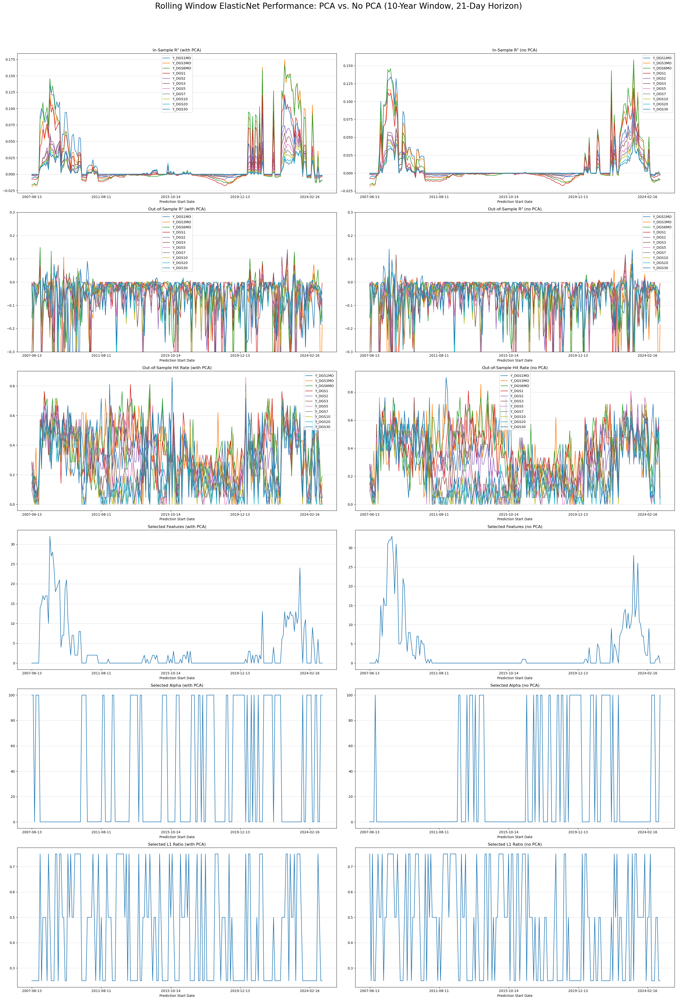

In [307]:
# Create the Visualization Grid

plt.close("all")
fig, axes = plt.subplots(6, 2, figsize=(28, 42))  # Increased height for 6 rows
fig.suptitle(
    "Rolling Window ElasticNet Performance: PCA vs. No PCA (10-Year Window, 21-Day Horizon)",
    fontsize=24,
    y=1.01,
)

plot_config = [
    {
        "df": r2_is_df,
        "ax": axes[0, 0],
        "title": "In-Sample R² (with PCA)",
        "ylim": None,
    },
    {
        "df": r2_is_df_nopca,
        "ax": axes[0, 1],
        "title": "In-Sample R² (no PCA)",
        "ylim": None,
    },
    {
        "df": r2_os_df,
        "ax": axes[1, 0],
        "title": "Out-of-Sample R² (with PCA)",
        "ylim": (-0.3, 0.3),
    },
    {
        "df": r2_os_df_nopca,
        "ax": axes[1, 1],
        "title": "Out-of-Sample R² (no PCA)",
        "ylim": (-0.3, 0.3),
    },
    {
        "df": hr_df,
        "ax": axes[2, 0],
        "title": "Out-of-Sample Hit Rate (with PCA)",
        "ylim": None,
    },
    {
        "df": hr_df_nopca,
        "ax": axes[2, 1],
        "title": "Out-of-Sample Hit Rate (no PCA)",
        "ylim": None,
    },
    {
        "df": fs_df,
        "ax": axes[3, 0],
        "title": "Selected Features (with PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": fs_df_nopca,
        "ax": axes[3, 1],
        "title": "Selected Features (no PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": alpha_df,
        "ax": axes[4, 0],
        "title": "Selected Alpha (with PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": alpha_df_nopca,
        "ax": axes[4, 1],
        "title": "Selected Alpha (no PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": l1_df,
        "ax": axes[5, 0],
        "title": "Selected L1 Ratio (with PCA)",
        "ylim": None,
        "legend": False,
    },
    {
        "df": l1_df_nopca,
        "ax": axes[5, 1],
        "title": "Selected L1 Ratio (no PCA)",
        "ylim": None,
        "legend": False,
    },
]

for config in plot_config:
    show_legend = config.get("legend", True)  # Show legend by default
    config["df"].plot(ax=config["ax"], title=config["title"], legend=show_legend)
    config["ax"].set_xlabel("Prediction Start Date")
    config["ax"].grid(True, axis="y", linestyle="--", linewidth=0.5)
    if config["ylim"]:
        config["ax"].set_ylim(config["ylim"])

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

#### Analysis of Rolling-Window ElasticNet Performance

This grid of plots compares the pipeline with PCA (left column) against the pipeline without PCA (right column). We can see that **both models fail to demonstrate any statistically significant out-of-sample (OOS) predictive power.** The models are severely overfit to the in-sample data.

#### Observations:

1.  **Out-of-Sample R² (Row 2):**
    * For both the PCA and No-PCA models, the OOS R² is highly volatile and centered around 0.0, frequently becoming negative. A negative OOS R² signifies that the model's forecast is worse than a simple historical mean, which is a definitive sign of an overfit model that has no generalizable, out-of-sample skill.

2.  **In-Sample R² (Row 1):**
    * The In-Sample R² is consistently low (mostly between 0.0 and 0.15), indicating that the features explain very little of the variance even within the 10-year training window.
    * The fact that a low-but-positive In-Sample R² is paired with a zero/negative Out-of-Sample R² is the classic signature of a model fitting to noise rather than a durable signal.

3.  **Hit Rate (Row 3):**
    * This plot confirms the OOS R² finding. The directional accuracy for both models is extremely volatile and appears to average around 0.5 (50%).
    * A 0.5 hit rate is equivalent to a random coin flip, confirming the models have no discernible skill in predicting the direction of yield changes.

4.  **Model Stability: Selected Features (Row 4) & Alpha (Row 5):**
    * The model is extremely unstable. The number of selected features (Row 4) is very volatile, jumping from near-zero to over 30 from one window to the next. The alpha (Row 5) is also unstable, oscillating between its minimum and maximum values. 

As a result, both ElasticNet models, with or without PCA, are overfitting the data. They fail to produce valid out-of-sample forecasts. The instability of the selected features and hyperparameters (alpha) in the non-PCA model strongly suggests that the features themselves have no consistent, predictive linear relationship with the target yields over the 21-day horizon.

### 4.1.4. Conclusion from Daily Regression Models



Our backtesting of regularized linear models (Ridge, Lasso, and ElasticNet) on the daily dataset do not allow us to get a generalizable, out-of-sample (OOS) predictive power, as shown by the:
1.  **OOS R-Squared:** The out-of-sample R² is consistently centered around zero and is frequently negative. This indicates our models' forecasts are statistically no better—and often worse—than a simple historical mean.
2.  **Hit Rate (Directional Accuracy):** The hit rate for all models averages approximately 0.5, which is statistically indistinguishable from a random coin flip.

The instability and overfitting observed suggest that the daily time series is too noisy. Attempting to fit more complex, non-linear models (such as deep neural networks) to this noisy daily data would likely increase overfitting and is unlikely to yield a robust model.

## 4.2. Classifications on Weekly Dataset

#### Methodology Introduction

Our analysis of the daily regression models demonstrated a severe lack of out-of-sample predictive power, with models consistently failing to outperform a simple benchmark. This suggests the daily data is dominated by high-frequency noise, and predicting the exact *magnitude* of yield changes is an overly complex task.

Based on these findings, we pivot our methodology in two fundamental ways to test a more tractable hypothesis:

1.  **Problem Simplification (Regression $\rightarrow$ Classification):** We move from regression to binary classification. Instead of predicting the *value* of the future yield, we now only predict its *direction* (1 for "Up," 0 for "Down/Flat"). This simplifies the problem, potentially making the underlying signal more detectable.
2.  **Temporal Aggregation (Daily $\rightarrow$ Weekly):** We aggregate our data to a weekly frequency. This acts as a natural filter, smoothing out the daily market noise and allowing the lower-frequency economic and financial signals to become more prominent.

#### Experimental Framework

We will evaluate the performance of four distinct classification models on this new weekly task:
* **Logistic Regression** (with L2-CV)
* **Random Forest**
* **XGBoost**
* **Long Short-Term Memory (LSTM) Network**

The models are trained and evaluated using the same rigorous rolling-window framework as in the previous section: a 15-year (780-week) training window is used to predict the subsequent 4 weeks, after which the window is rolled forward.

#### Feature Selection: Mutual Information & PCA

To handle our high-dimensional feature set, we employ a filter method based on **Mutual Information (MI)**, which excels at capturing non-linear relationships. We will train our models on several distinct datasets, each created by filtering features based on a different MI threshold (e.g., 0.03, 0.035, 0.04, and 0.05) to find the optimal feature set.

A special case is made for the `MI > 0.03` dataset. This set contains 266 features, which is a very high dimensionality relative to our 780-week training window. This "curse of dimensionality" can lead to model instability and overfitting. Therefore, for this specific dataset, we will test two variants of each model:
1.  **Standard:** The model trained on all 266 features.
2.  **PCA Variant:** A model trained on principal components, with `PCA(n_components=0.99)` applied within the pipeline to reduce dimensionality and multicollinearity.

In [26]:
# Define Backtest Configuration

# Define the rolling window parameters
TRAIN_WINDOW_SIZE = 52 * 15  # 15 years of weekly data
FORECAST_HORIZON = 4  # Predict 4 weeks ahead
ROLL_STEP_SIZE = 4  # Roll the window forward by the forecast horizon


In [ ]:
# Define Helper: Save Results Function


def save_results(file_prefix, acc, params, feature_imp, ypred, ytrue):
    """Saves all result DataFrames to parquet files."""
    print(f"Saving results for prefix: {file_prefix}")
    acc.to_parquet(f"model_results/accuracies_{file_prefix}.parquet")
    params.to_parquet(f"model_results/params_{file_prefix}.parquet")
    feature_imp.to_parquet(f"model_results/feature_importance_{file_prefix}.parquet")
    ypred.to_parquet(f"model_results/forecast_{file_prefix}.parquet")
    ytrue.to_parquet(f"model_results/true_values_{file_prefix}.parquet")

### 4.2.1. Logistic Regression

In [64]:
# Define Hyperparameter Grid for LogisticRegressionCV
LOGREG_CS_GRID = np.logspace(-5, 2, 30)

# Define the inner-loop cross-validator for hyperparameter tuning.
INNER_LOOP_CV = TimeSeriesSplit(n_splits=4)

In [65]:
# Define Helper: Backtest Function


def run_rolling_logreg_backtest(pipeline, X_data, Y_data, train_window, pred_window):
    """
    Runs a full rolling-window backtest for a given Logistic Regression pipeline.

    Returns tuple of DataFrames:
    (accuracies, best_Cs, feature_coefs, y_predictions, y_true_all)
    """

    # Lists to store results from each fold
    accuracies_list = []
    best_C_list = []
    feature_coefs_list = []
    y_pred_list = []
    y_true_list = []

    total_steps = len(X_data) - train_window - pred_window + 1

    for start in tqdm(range(0, total_steps, pred_window)):
        end_train = start + train_window
        end_pred = end_train + pred_window

        X_train = X_data.iloc[start:end_train]
        Y_train = Y_data.iloc[start:end_train]
        X_test = X_data.iloc[end_train:end_pred]
        Y_test = Y_data.iloc[end_train:end_pred]

        y_true_list.append(Y_test)

        # Fit model
        pipeline.fit(X_train, Y_train)
        Y_pred = pipeline.predict(X_test)
        y_pred_list.append(Y_pred)

        # Initialize dicts to store metrics for this fold
        fold_accuracies = {}
        fold_best_C = {}
        fold_feature_coefs = {}

        # Extract metrics for each target (maturity)
        for i, col in enumerate(Y_train.columns):
            fold_accuracies[col] = accuracy_score(Y_test[col], Y_pred[:, i])

            # Get the fitted estimator for this specific target
            estimator = pipeline.named_steps["logreg"].estimators_[i]

            fold_best_C[col] = estimator.C_[0]
            fold_feature_coefs[col] = np.abs(estimator.coef_).flatten()

        accuracies_list.append(fold_accuracies)
        best_C_list.append(fold_best_C)
        feature_coefs_list.append(fold_feature_coefs)

    # Aggregate and Format Results

    # Concatenate all true Y values to get the correct full index
    y_true_df = pd.concat(y_true_list)

    # Get the start date of each fold for the results DataFrames
    fold_start_dates = y_true_df.index[::pred_window]

    # Create DataFrames
    acc_df = pd.DataFrame(
        accuracies_list, columns=Y_data.columns, index=fold_start_dates
    )
    params_df = pd.DataFrame(
        best_C_list, columns=Y_data.columns, index=fold_start_dates
    )

    feature_imp_df = pd.DataFrame(
        feature_coefs_list, columns=Y_data.columns, index=fold_start_dates
    )

    # Create aligned prediction/true DataFrames
    y_pred_df = pd.DataFrame(
        np.concatenate(y_pred_list), index=y_true_df.index, columns=Y_data.columns
    )

    return acc_df, params_df, feature_imp_df, y_pred_df, y_true_df


In [ ]:
# Main Backtest Loop

for threshold in threshold_list:
    print(f"\n--- Training on Mutual Info Threshold: {threshold} ---")
    Xw = datasets[threshold]

    pipe_nopca = Pipeline(
        [
            ("scaler", StandardScaler()),
            (
                "logreg",
                MultiOutputClassifier(
                    LogisticRegressionCV(
                        penalty="l2",
                        cv=INNER_LOOP_CV,
                        Cs=LOGREG_CS_GRID,
                        fit_intercept=False,
                        scoring="accuracy",
                        max_iter=5000,
                        random_state=SEED,
                    )
                ),
            ),
        ]
    )

    # Run the standard (no PCA) model for this threshold
    (acc_l2, params_l2, f_imp_l2, ypred_l2, ytrue_l2) = run_rolling_logreg_backtest(
        pipe_nopca, Xw, Yw_binary, TRAIN_WINDOW_SIZE, FORECAST_HORIZON
    )

    # Save the results
    file_prefix = f"logreg_MI_{threshold}"
    save_results(file_prefix, acc_l2, params_l2, f_imp_l2, ypred_l2, ytrue_l2)
    print(f"Average accuracy for MI > {threshold} (No PCA):")
    print(acc_l2.mean())

    # For the 0.03 threshold, also run the PCA variant
    if threshold == 0.03:
        print(f"--- Running special PCA case for MI Threshold: {threshold} ---")

        pipe_pca = Pipeline(
            [
                ("scaler", StandardScaler()),
                ("pca", PCA(n_components=0.99, random_state=SEED)),
                (
                    "logreg",
                    MultiOutputClassifier(
                        LogisticRegressionCV(
                            penalty="l2",
                            cv=INNER_LOOP_CV,
                            Cs=LOGREG_CS_GRID,
                            fit_intercept=False,
                            scoring="accuracy",
                            max_iter=5000,
                            random_state=SEED,
                        )
                    ),
                ),
            ]
        )

        (acc_pca, params_pca, f_imp_pca, ypred_pca, ytrue_pca) = (
            run_rolling_logreg_backtest(
                pipe_pca, Xw, Yw_binary, TRAIN_WINDOW_SIZE, FORECAST_HORIZON
            )
        )

        # Save PCA results
        file_prefix_pca = "logreg_pca_MI_0.03"
        save_results(
            file_prefix_pca, acc_pca, params_pca, f_imp_pca, ypred_pca, ytrue_pca
        )
        print(f"Average accuracy for MI > {threshold} (WITH PCA):")
        print(acc_pca.mean())

print("All backtests complete.")

Our preliminary results for the logistic regression models appear to show a modest improvement over the daily regression task. While the daily models consistently failed to show out-of-sample (OOS) skill (OOS R² $\approx$ 0 and hit rates $\approx$ 0.5), our weekly classification models seem to be achieving accuracies above the 50% random-guess baseline.

Although these results require deeper analysis, this initial finding suggests our methodological pivot may be correct:
1.  **Classification** (predicting direction) may be a more tractable problem than **regression** (predicting magnitude).
2.  **Weekly data** likely provides a better signal-to-noise ratio than daily data.

Given that this potential signal is visible even with a simple linear classifier (Logistic Regression), we are optimistic that more powerful, **non-linear models** (Random Forest, XGBoost, and LSTM) may be able to better capture the complex patterns in the data. We will now proceed to test these models on the same framework.

### 4.2.2. XGBoost

In [28]:
# Parameters to test in cross-validation
param_grid = {
    "xgb__estimator__n_estimators": [100, 200],
    "xgb__estimator__learning_rate": [0.01, 0.05],
    "xgb__estimator__max_depth": [4, 7],
    "xgb__estimator__subsample": [0.5, 0.7],
    "xgb__estimator__colsample_bytree": [0.4, 0.8],
    "xgb__estimator__min_child_weight": [5, 10],
    "xgb__estimator__reg_alpha": [0.5, 1.0],
    "xgb__estimator__reg_lambda": [5, 10],
}

# Define Base Model Pipelines

# Pipeline without PCA
pipe = Pipeline(
    [
        ("scaler", StandardScaler()),
        (
            "xgb",
            MultiOutputClassifier(
                XGBClassifier(
                    objective="binary:logistic",
                    use_label_encoder=False,
                    n_jobs=-1,  # n_jobs in XGBClassifier is for tree-building
                    random_state=SEED,
                    verbosity=0,
                )
            ),
        ),
    ]
)

# Pipeline with PCA
pipepca = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("pca", PCA(n_components=0.99, random_state=SEED)),
        (
            "xgb",
            MultiOutputClassifier(
                XGBClassifier(
                    objective="binary:logistic",
                    use_label_encoder=False,
                    n_jobs=-1,
                    random_state=SEED,
                    verbosity=0,
                )
            ),
        ),
    ]
)

In [29]:
# Define the inner-loop cross-validator for hyperparameter tuning.
INNER_LOOP_CV = TimeSeriesSplit(n_splits=4)

In [30]:
# Define Helper: Backtest Function


def run_rolling_xgb_backtest(
    pipeline, X_data, Y_data, param_grid, tscv, train_window, pred_window
):
    """
    Runs a full rolling-window backtest for a given XGBoost pipeline
    using GridSearchCV inside each loop.

    Returns tuple of DataFrames:
    (accuracies, parameters, feature_importances, y_predictions, y_true_all)
    """

    # Lists to store results from each fold
    accuracies_list = []
    params_list = []
    feature_imp_list = []
    y_pred_list = []
    y_true_list = []

    total_steps = len(X_data) - train_window - pred_window + 1

    for start in tqdm(range(0, total_steps, pred_window)):
        end_train = start + train_window
        end_pred = end_train + pred_window

        Xw_train = X_data.iloc[start:end_train]
        Yw_train = Y_data.iloc[start:end_train]
        Xw_test = X_data.iloc[end_train:end_pred]
        Yw_test = Y_data.iloc[end_train:end_pred]

        y_true_list.append(Yw_test)

        # Run the (expensive) GridSearchCV on the training data
        grid = GridSearchCV(
            pipeline, param_grid, cv=tscv, scoring="accuracy", n_jobs=-1, verbose=0
        )
        grid.fit(Xw_train, Yw_train)
        best_model = grid.best_estimator_

        # Predict and store
        Yw_pred = best_model.predict(Xw_test)
        y_pred_list.append(Yw_pred)

        # Initialize dicts to store metrics for this fold
        fold_accuracies = {}
        fold_params = {}
        fold_feature_imp = {}

        # Extract metrics for each target (maturity)
        for i, col in enumerate(Yw_train.columns):
            fold_accuracies[col] = accuracy_score(Yw_test[col], Yw_pred[:, i])

            # Get the fitted estimator for this specific target
            estimator = best_model.named_steps["xgb"].estimators_[i]

            fold_params[col] = estimator.get_params()
            fold_feature_imp[col] = estimator.feature_importances_

        accuracies_list.append(fold_accuracies)
        params_list.append(fold_params)
        feature_imp_list.append(fold_feature_imp)

    # Aggregate and Format Results

    # Concatenate all true Y values to get the correct full index
    ytrue_df = pd.concat(y_true_list)

    # Get the start date of each fold for the results DataFrames
    fold_start_dates = ytrue_df.index[::pred_window]

    acc_df = pd.DataFrame(
        accuracies_list, columns=Y_data.columns, index=fold_start_dates
    )
    params_df = pd.DataFrame(
        params_list, columns=Y_data.columns, index=fold_start_dates
    )
    feature_imp_df = pd.DataFrame(
        feature_imp_list, columns=Y_data.columns, index=fold_start_dates
    )

    ypred_df = pd.DataFrame(
        np.concatenate(y_pred_list), index=ytrue_df.index, columns=Y_data.columns
    )

    return acc_df, params_df, feature_imp_df, ypred_df, ytrue_df

In [31]:
# Main Backtest Loop

for threshold in threshold_list[1:]:
    print(f"\n--- Training on Mutual Info Threshold: {threshold} ---")
    Xw = datasets[threshold]

    if threshold == 0.03:
        # Run No-PCA Model
        print("Running No-PCA model for threshold 0.03...")
        (acc, params, f_imp, ypred, ytrue) = run_rolling_xgb_backtest(
            pipe,
            Xw,
            Yw_binary,
            param_grid,
            INNER_LOOP_CV,
            TRAIN_WINDOW_SIZE,
            FORECAST_HORIZON,
        )

        print(f"Average accuracy (No PCA, MI > {threshold}):")
        print(acc.mean())
        save_results("xgboost_MI_0.03", acc, params, f_imp, ypred, ytrue)

        # Run PCA Model
        print("Running PCA model for threshold 0.03...")
        (acc_pca, params_pca, f_imp_pca, ypred_pca, ytrue_pca) = (
            run_rolling_xgb_backtest(
                pipepca,
                Xw,
                Yw_binary,
                param_grid,
                INNER_LOOP_CV,
                TRAIN_WINDOW_SIZE,
                FORECAST_HORIZON,
            )
        )

        print(f"Average accuracy (WITH PCA, MI > {threshold}):")
        print(acc_pca.mean())
        save_results(
            "xgboost_pca_MI_0.03",
            acc_pca,
            params_pca,
            f_imp_pca,
            ypred_pca,
            ytrue_pca,
        )

    else:
        # Run No-PCA Model for other thresholds
        print(f"Running No-PCA model for threshold {threshold}...")
        (acc, params, f_imp, ypred, ytrue) = run_rolling_xgb_backtest(
            pipe,
            Xw,
            Yw_binary,
            param_grid,
            INNER_LOOP_CV,
            TRAIN_WINDOW_SIZE,
            FORECAST_HORIZON,
        )

        print(f"Average accuracy (No PCA, MI > {threshold}):")
        print(acc.mean())
        save_results(f"xgboost_MI_{threshold}", acc, params, f_imp, ypred, ytrue)

print("All backtests complete.")


--- Training on Mutual Info Threshold: 0.035 ---
Running No-PCA model for threshold 0.035...


100%|██████████| 76/76 [1:03:31<00:00, 50.15s/it]


Average accuracy (No PCA, MI > 0.035):
Y_DGS1MO    0.753289
Y_DGS3MO    0.684211
Y_DGS6MO    0.638158
Y_DGS1      0.569079
Y_DGS2      0.555921
Y_DGS3      0.552632
Y_DGS5      0.526316
Y_DGS7      0.529605
Y_DGS10     0.539474
Y_DGS20     0.536184
Y_DGS30     0.546053
dtype: float64
Saving results for prefix: xgboost_MI_0.035

--- Training on Mutual Info Threshold: 0.04 ---
Running No-PCA model for threshold 0.04...


100%|██████████| 76/76 [53:25<00:00, 42.17s/it]


Average accuracy (No PCA, MI > 0.04):
Y_DGS1MO    0.753289
Y_DGS3MO    0.684211
Y_DGS6MO    0.638158
Y_DGS1      0.575658
Y_DGS2      0.536184
Y_DGS3      0.562500
Y_DGS5      0.532895
Y_DGS7      0.519737
Y_DGS10     0.539474
Y_DGS20     0.542763
Y_DGS30     0.546053
dtype: float64
Saving results for prefix: xgboost_MI_0.04

--- Training on Mutual Info Threshold: 0.05 ---
Running No-PCA model for threshold 0.05...


100%|██████████| 76/76 [34:15<00:00, 27.05s/it]

Average accuracy (No PCA, MI > 0.05):
Y_DGS1MO    0.753289
Y_DGS3MO    0.684211
Y_DGS6MO    0.644737
Y_DGS1      0.582237
Y_DGS2      0.542763
Y_DGS3      0.529605
Y_DGS5      0.523026
Y_DGS7      0.526316
Y_DGS10     0.539474
Y_DGS20     0.552632
Y_DGS30     0.549342
dtype: float64
Saving results for prefix: xgboost_MI_0.05
All backtests complete.


### 4.2.3. Random Forest

In [32]:
# Define the inner-loop cross-validator for hyperparameter tuning.
INNER_LOOP_CV = TimeSeriesSplit(n_splits=4)

In [32]:
# Parameters to test in cross-validation
param_grid = {
    "rf__estimator__n_estimators": [150],
    "rf__estimator__max_depth": [4, 7],
    "rf__estimator__min_samples_leaf": [5, 10],
}

# Define Base Model Pipelines

# Pipeline without PCA
pipe_nopca = Pipeline(
    [
        ("scaler", StandardScaler()),
        (
            "rf",
            MultiOutputClassifier(RandomForestClassifier(n_jobs=-1, random_state=SEED)),
        ),
    ]
)

# Pipeline with PCA
pipe_pca = Pipeline(
    [
        ("scaler", StandardScaler()),
        ("pca", PCA(n_components=0.99, random_state=SEED)),
        (
            "rf",
            MultiOutputClassifier(RandomForestClassifier(n_jobs=-1, random_state=SEED)),
        ),
    ]
)

In [33]:
# Define Helper: Backtest Function


def run_rolling_gridsearch_backtest(
    pipeline, X_data, Y_data, param_grid, tscv, train_window, pred_window
):
    """
    Runs a full rolling-window backtest for a given pipeline
    using GridSearchCV inside each loop.

    Returns tuple of DataFrames:
    (accuracies, parameters, feature_importances, y_predictions, y_true_all)
    """

    # Lists to store results from each fold
    accuracies_list = []
    params_list = []
    feature_imp_list = []
    y_pred_list = []
    y_true_list = []

    total_steps = len(X_data) - train_window - pred_window + 1

    for start in tqdm(range(0, total_steps, pred_window)):
        end_train = start + train_window
        end_pred = end_train + pred_window

        Xw_train = X_data.iloc[start:end_train]
        Yw_train = Y_data.iloc[start:end_train]
        Xw_test = X_data.iloc[end_train:end_pred]
        Yw_test = Y_data.iloc[end_train:end_pred]

        y_true_list.append(Yw_test)

        grid = GridSearchCV(
            pipeline, param_grid, cv=tscv, scoring="accuracy", n_jobs=-1, verbose=0
        )
        grid.fit(Xw_train, Yw_train)
        best_model = grid.best_estimator_

        # Predict and store
        Yw_pred = best_model.predict(Xw_test)
        y_pred_list.append(Yw_pred)

        # Initialize dicts to store metrics for this fold
        fold_accuracies = {}
        fold_params = {}
        fold_feature_imp = {}

        # Extract metrics for each target (maturity)
        for i, col in enumerate(Yw_train.columns):
            fold_accuracies[col] = accuracy_score(Yw_test[col], Yw_pred[:, i])

            # Get the fitted estimator for this specific target
            estimator = best_model.named_steps["rf"].estimators_[i]

            fold_params[col] = estimator.get_params()
            # Note: For PCA, this will be importance on the components,
            # not the original features.
            fold_feature_imp[col] = estimator.feature_importances_

        accuracies_list.append(fold_accuracies)
        params_list.append(fold_params)
        feature_imp_list.append(fold_feature_imp)

    # Aggregate and Format Results

    ytrue_df = pd.concat(y_true_list)

    fold_start_dates = ytrue_df.index[::pred_window]

    acc_df = pd.DataFrame(
        accuracies_list, columns=Y_data.columns, index=fold_start_dates
    )
    params_df = pd.DataFrame(
        params_list, columns=Y_data.columns, index=fold_start_dates
    )
    feature_imp_df = pd.DataFrame(
        feature_imp_list, columns=Y_data.columns, index=fold_start_dates
    )

    # Create aligned prediction/true DataFrames
    ypred_df = pd.DataFrame(
        np.concatenate(y_pred_list), index=ytrue_df.index, columns=Y_data.columns
    )

    return acc_df, params_df, feature_imp_df, ypred_df, ytrue_df

In [34]:
# Define Helper: Save Results Function


def save_results_rf(file_prefix, acc, params, feature_imp, ypred, ytrue):
    """Saves all result DataFrames to parquet files."""
    print(f"Saving results for prefix: {file_prefix}")
    base_path = "model_results/"
    acc.to_parquet(f"{base_path}accuracies_{file_prefix}.parquet")
    params.to_parquet(f"{base_path}params_{file_prefix}.parquet")
    feature_imp.to_parquet(f"{base_path}feature_importance_{file_prefix}.parquet")
    ypred.to_parquet(f"{base_path}forecast_{file_prefix}.parquet")
    ytrue.to_parquet(f"{base_path}true_values_{file_prefix}.parquet")

In [ ]:
# Main Backtest Loop

for threshold in threshold_list:
    print(f"\n--- Training on Mutual Info Threshold: {threshold} ---")
    Xw = datasets[threshold]

    if threshold == 0.03:
        # Run No-PCA Model
        print("Running No-PCA model for threshold 0.03...")
        (acc, params, f_imp, ypred, ytrue) = run_rolling_gridsearch_backtest(
            pipe_nopca,
            Xw,
            Yw_binary,
            param_grid,
            INNER_LOOP_CV,
            TRAIN_WINDOW_SIZE,
            FORECAST_HORIZON,
        )

        print(f"Average accuracy (No PCA, MI > {threshold}):")
        print(acc.mean())
        save_results_rf(
            "random_forest_MI_0.03", acc, params, f_imp, ypred, ytrue
        )

        # Run PCA Model
        print("Running PCA model for threshold 0.03...")
        (acc_pca, params_pca, f_imp_pca, ypred_pca, ytrue_pca) = (
            run_rolling_gridsearch_backtest(
                pipe_pca,
                Xw,
                Yw_binary,
                param_grid,
                INNER_LOOP_CV,
                TRAIN_WINDOW_SIZE,
                FORECAST_HORIZON,
            )
        )

        print(f"Average accuracy (WITH PCA, MI > {threshold}):")
        print(acc_pca.mean())
        save_results_rf(
            "random_forest_pca_MI_0.03",
            acc_pca,
            params_pca,
            f_imp_pca,
            ypred_pca,
            ytrue_pca,
        )

    else:
        # Run No-PCA Model for other thresholds
        print(f"Running No-PCA model for threshold {threshold}...")
        (acc, params, f_imp, ypred, ytrue) = run_rolling_gridsearch_backtest(
            pipe_nopca,
            Xw,
            Yw_binary,
            param_grid,
            INNER_LOOP_CV,
            TRAIN_WINDOW_SIZE,
            FORECAST_HORIZON,
        )

        print(f"Average accuracy (No PCA, MI > {threshold}):")
        print(acc.mean())
        save_results_rf(
            f"random_forest_MI_{threshold}",
            acc,
            params,
            f_imp,
            ypred,
            ytrue,
        )

print("All backtests complete.")


--- Training on Mutual Info Threshold: 0.035 ---
Running No-PCA model for threshold 0.035...


100%|██████████| 76/76 [07:20<00:00,  5.80s/it]


Average accuracy (No PCA, MI > 0.035):
Y_DGS1MO    0.753289
Y_DGS3MO    0.680921
Y_DGS6MO    0.664474
Y_DGS1      0.575658
Y_DGS2      0.582237
Y_DGS3      0.578947
Y_DGS5      0.542763
Y_DGS7      0.532895
Y_DGS10     0.559211
Y_DGS20     0.555921
Y_DGS30     0.546053
dtype: float64
Saving results for prefix: random forest, MI 0.035, 15y train test

--- Training on Mutual Info Threshold: 0.04 ---
Running No-PCA model for threshold 0.04...


100%|██████████| 76/76 [07:23<00:00,  5.83s/it]


Average accuracy (No PCA, MI > 0.04):
Y_DGS1MO    0.753289
Y_DGS3MO    0.664474
Y_DGS6MO    0.674342
Y_DGS1      0.575658
Y_DGS2      0.585526
Y_DGS3      0.582237
Y_DGS5      0.542763
Y_DGS7      0.532895
Y_DGS10     0.539474
Y_DGS20     0.542763
Y_DGS30     0.578947
dtype: float64
Saving results for prefix: random forest, MI 0.04, 15y train test

--- Training on Mutual Info Threshold: 0.05 ---
Running No-PCA model for threshold 0.05...


100%|██████████| 76/76 [06:58<00:00,  5.51s/it]

Average accuracy (No PCA, MI > 0.05):
Y_DGS1MO    0.753289
Y_DGS3MO    0.680921
Y_DGS6MO    0.671053
Y_DGS1      0.572368
Y_DGS2      0.582237
Y_DGS3      0.585526
Y_DGS5      0.536184
Y_DGS7      0.532895
Y_DGS10     0.529605
Y_DGS20     0.536184
Y_DGS30     0.542763
dtype: float64
Saving results for prefix: random forest, MI 0.05, 15y train test
All backtests complete.


### 4.2.4. Long Short Term Memory Recurrent Neural Network (LSTM)

#### 4.2.4.1. LSTM Framework

For our final model, the Long Short-Term Memory (LSTM) network, we focus exclusively on the richest and most complex feature set: the `MI > 0.02` dataset. This dataset haven't been used for other models.

Our rationale for this is twofold. First, we want to test the primary theoretical advantage of deep learning: an LSTM, with its complex recurrent structure, is designed to learn from high-dimensional sequences and capture subtle non-linear dynamics or long-range dependencies that simpler models (like Logistic Regression or Random Forest) cannot. By providing the model with all 266 features, we are tasking it with acting as an end-to-end feature extractor, learning the optimal representation from the raw (though filtered) data.

Second, this high dimensionality (266 features vs. 780 training samples) presents a significant and well-documented risk of overfitting. To properly test the model under these conditions, we will replicate the same experiment we ran for our XGBoost and Random Forest models:

-  **LSTM (Standard):** The model is trained on the full 266-feature set. We will rely heavily on strong regularization techniques, including **L2 weight decay** in the optimizer and **Dropout** in the network layers, to manage this high dimensionality.

In [38]:
initial_number_of_features = Xw.shape[1]

threshold_mi = 0.02


selected_features_w = set()
for col in Yw_binary.columns:
    mi = mutual_info_classif(Xw, Yw_binary[col], random_state=SEED)
    top_features_i = Xw.columns[mi > threshold_mi]
    selected_features_w.update(top_features_i)

Xw_002 = Xw[list(selected_features_w)]

print(
    f"{initial_number_of_features - len(selected_features_w)} features were removed for threshold {threshold_mi}."
)
print(f"So that {Xw_002.shape[1]} features are left for that threshold {threshold_mi}.")
print(
    f"Features that are left, bar target related ones, are\
    \n{[col for col in Xw_002.columns if not col.startswith(('Y', 'DGS'))]}."
)

0 features were removed for threshold 0.02.
So that 81 features are left for that threshold 0.02.
Features that are left, bar target related ones, are    
['SRVPRD', 'MANEMP', 'IRLTLT01CAM156N', 'IRLTLT01GBM156N', 'FGEXPND', 'USWTRADE', 'USCONS', 'DTCTHFNM', 'GFDEGDQ188S', 'CPIAUCSL', 'USTRADE', 'FGDEF', 'FYGFDPUN', 'USGOVT', 'PERMIT', 'INDPRO', 'DMANEMP', 'M1SL', 'CUUR0000SA0L2', 'DTCOLNVHFNM', 'CURRCIR', 'NONREVSL', 'NDMANEMP', 'RPI', 'CUUR0000SAD', 'PCEPI', 'TOTRESNS', 'M2SL', 'CUSR0000SAC', 'USGOOD', 'HOUST', 'IRLTLT01DEM156N', 'CPITRNSL', 'UEMP5TO14', 'M2REAL', 'CPIULFSL', 'FEDFUNDS', 'GFDEBTN', 'MTSDS133FMS', 'BOGMBASE', 'USTPU', 'USFIRE', 'DNDGRG3M086SBEA', 'PAYEMS', 'CPIAPPSL', 'IRLTLT01AUM156N', 'UMCSENT'].


In [39]:
# Helper Function: Create Sequences


def create_sequences(features, targets, lookback_weeks, forecast_horizon):
    """
    Transforms time-series data into sequences for LSTM.

    Args:
        features (np.array): Standardized features.
        targets (np.array): Binary targets (n_samples, n_maturities).
        lookback_weeks (int): How many weeks of history to use (L).
        forecast_horizon (int): How many weeks ahead to predict (4).

    Returns:
        X (np.array): Input sequences, shape (samples, lookback, n_features)
        y (np.array): Target sequences, shape (samples, forecast_horizon, n_maturities)
    """
    X, y = [], []
    n_samples = len(features)

    for i in range(n_samples):
        # Find the end of this sequence
        feature_end = i + lookback_weeks
        target_end = feature_end + forecast_horizon

        # Stop if we are at the end of the dataset
        if target_end > n_samples:
            break

        # Get input (history) and output (future)
        seq_x = features[i:feature_end, :]
        seq_y = targets[feature_end:target_end, :]

        X.append(seq_x)
        y.append(seq_y)

    return np.array(X), np.array(y)

In [40]:
# Define LSTM class parameters

lstm_hidden_1 = 128
lstm_hidden_2 = 64
dense_hidden = 128
dropout_rate = 0.3

In [41]:
class LSTMClassifier(nn.Module):
    """
    PyTorch-based LSTM Classifier for multi-step, multi-output forecasting.
    """

    def __init__(
        self,
        n_features,
        n_maturities,
        forecast_horizon=FORECAST_HORIZON,
        lstm_hidden_1=lstm_hidden_1,
        lstm_hidden_2=lstm_hidden_2,
        dense_hidden=dense_hidden,
    ):
        super(LSTMClassifier, self).__init__()

        self.forecast_horizon = forecast_horizon
        self.n_maturities = n_maturities

        # Define Layers

        self.lstm1 = nn.LSTM(
            input_size=n_features,
            hidden_size=lstm_hidden_1,
            num_layers=1,
            batch_first=True,
        )
        self.dropout1 = nn.Dropout(dropout_rate)

        self.lstm2 = nn.LSTM(
            input_size=lstm_hidden_1,
            hidden_size=lstm_hidden_2,
            num_layers=1,
            batch_first=True,
        )
        self.dropout2 = nn.Dropout(dropout_rate)

        self.dense1 = nn.Linear(lstm_hidden_2, dense_hidden)
        self.relu = nn.ReLU()

        self.output_layer = nn.Linear(dense_hidden, forecast_horizon * n_maturities)

        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        """Defines the forward pass of the model."""

        # x shape: (batch_size, lookback_weeks, n_features)

        # lstm1 output (output, (h_n, c_n))
        lstm_out1, _ = self.lstm1(x)
        lstm_out1 = self.dropout1(lstm_out1)

        # lstm2 output
        lstm_out2, _ = self.lstm2(lstm_out1)

        # Get the last hidden state from the sequence
        last_hidden_state = lstm_out2[:, -1, :]
        last_hidden_state = self.dropout2(last_hidden_state)

        # Pass through dense layers
        dense_out = self.relu(self.dense1(last_hidden_state))

        # Get final flat output
        flat_output = self.output_layer(dense_out)

        # Apply sigmoid activation
        prob_output = self.sigmoid(flat_output)

        # Reshape to (batch_size, forecast_horizon, M)
        final_output = prob_output.view(-1, self.forecast_horizon, self.n_maturities)

        return final_output

In [42]:
# Define Train Parameters

epochs = 50
batch_size = 32
patience = 10
learning_rate = 1e-3

In [43]:
def train_model_torch(
    model,
    X_train,
    y_train,
    X_val,
    y_val,
    device,
    epochs=epochs,
    batch_size=batch_size,
    patience=patience,
    lr=learning_rate,
):
    """
    PyTorch training and validation loop with early stopping.
    """

    # A. Create DataLoaders
    train_dataset = TensorDataset(X_train, y_train)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    val_dataset = TensorDataset(X_val, y_val)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    # B. Define Loss and Optimizer
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=1.0e-4)

    # C. Early Stopping setup
    best_val_loss = float("inf")
    patience_counter = 0
    best_model_state = None

    history = {"train_loss": [], "val_loss": []}

    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = 0.0
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)

        train_loss /= len(train_loader.dataset)
        history["train_loss"].append(train_loss)

        # Validation
        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for inputs, targets in val_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                val_loss += loss.item() * inputs.size(0)

        val_loss /= len(val_loader.dataset)
        history["val_loss"].append(val_loss)

        # Early Stopping Check
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            # Save the best model state
            best_model_state = copy.deepcopy(model.state_dict())
        else:
            patience_counter += 1

        if patience_counter >= patience:
            break

    # Restore best model weights
    if best_model_state:
        model.load_state_dict(best_model_state)

    return model, history  # Return the best (early-stopped) trained model

In [44]:
# Define Rolling Forecast Parameters

ROLL_STEP = 4
LOOKBACK_WEEKS = 52
use_pca = False
pca_variance_threshold = 0.99

In [45]:
def run_rolling_forecast_torch(
    all_features_df,
    all_targets_df,
    n_maturities,
    lookback_weeks=LOOKBACK_WEEKS,
    train_val_window_weeks=TRAIN_WINDOW_SIZE,
    val_split_ratio=0.2,
    forecast_horizon=FORECAST_HORIZON,
    roll_step_weeks=ROLL_STEP,
    use_pca=use_pca,
    pca_variance_threshold=pca_variance_threshold,
):
    """
    Conducts the full rolling-window forecast using PyTorch.
    """

    model_type = "LSTM with PCA" if use_pca else "LSTM (No PCA)"
    print(f"Starting PyTorch rolling forecast for: {model_type}...")

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    all_predictions = []
    last_fold_history = None
    val_weeks = int(train_val_window_weeks * val_split_ratio)
    train_weeks = train_val_window_weeks - val_weeks
    start_pred_idx = train_val_window_weeks

    for t in tqdm(
        range(
            start_pred_idx, len(all_features_df) - forecast_horizon + 1, roll_step_weeks
        )
    ):
        # A. Define Window Indices
        pred_input_start = t - lookback_weeks
        pred_input_end = t
        val_end = pred_input_end
        train_start = val_end - train_val_window_weeks

        if train_start < 0:
            continue

        # B. Get Data Slices
        train_val_features_df = all_features_df.iloc[train_start:val_end]
        test_lookback_features_df = all_features_df.iloc[
            pred_input_start:pred_input_end
        ]
        train_val_targets_df = all_targets_df.iloc[
            train_start : val_end + forecast_horizon
        ]

        # C. Standardize Features (and optionally apply PCA)
        scaler = StandardScaler()
        train_only_features = train_val_features_df.iloc[:train_weeks]
        # Fit ONLY on training data
        scaler.fit(train_only_features.values)

        n_features_for_model = all_features_df.shape[1]  # Default

        if use_pca:
            pca = PCA(n_components=pca_variance_threshold)
            pca.fit(train_only_features)
            n_features_for_model = pca.n_components_

            # Transform all feature blocks
            train_val_features_transformed = pca.transform(
                scaler.transform(train_val_features_df.values)
            )
            test_lookback_features_transformed = pca.transform(
                scaler.transform(test_lookback_features_df.values)
            )
        else:
            # Just use the scaled features
            train_val_features_transformed = scaler.transform(
                train_val_features_df.values
            )
            test_lookback_features_transformed = scaler.transform(
                test_lookback_features_df.values
            )

        # D. Create Sequences
        X_train_val_seq, y_train_val_seq = create_sequences(
            train_val_features_transformed,
            train_val_targets_df.values,
            lookback_weeks,
            forecast_horizon,
        )

        if len(X_train_val_seq) == 0:
            continue

        # E. Split Sequences
        split_idx = train_weeks - lookback_weeks + 1
        if split_idx <= 0 or split_idx >= len(X_train_val_seq):
            continue

        X_train, y_train = X_train_val_seq[:split_idx], y_train_val_seq[:split_idx]
        X_val, y_val = X_train_val_seq[split_idx:], y_train_val_seq[split_idx:]

        if len(X_train) == 0 or len(X_val) == 0:
            continue

        # F. Convert to PyTorch Tensors
        X_train_tensor = torch.from_numpy(X_train).float().to(device)
        y_train_tensor = torch.from_numpy(y_train).float().to(device)
        X_val_tensor = torch.from_numpy(X_val).float().to(device)
        y_val_tensor = torch.from_numpy(y_val).float().to(device)

        # G. Build, Train, and Predict
        model = LSTMClassifier(
            n_features=n_features_for_model,
            n_maturities=n_maturities,
            forecast_horizon=forecast_horizon,
        ).to(device)

        model, history = train_model_torch(
            model,
            X_train_tensor,
            y_train_tensor,
            X_val_tensor,
            y_val_tensor,
            device,
        )
        last_fold_history = history

        # H. Make Out-of-Sample Prediction
        X_pred_tensor = (
            torch.from_numpy(
                test_lookback_features_transformed.reshape(1, lookback_weeks, -1)
            )
            .float()
            .to(device)
        )

        model.eval()
        with torch.no_grad():
            y_pred_probs_tensor = model(X_pred_tensor)
        y_pred_probs = y_pred_probs_tensor.cpu().numpy()[0]

        # I. Store Prediction
        prediction_date = all_features_df.index[pred_input_end - 1]
        target_dates = all_targets_df.index[t : t + forecast_horizon]

        for week_ahead in range(forecast_horizon):
            for mat_idx, mat_name in enumerate(all_targets_df.columns):
                pred_prob = y_pred_probs[week_ahead, mat_idx]
                target_date = target_dates[week_ahead]

                all_predictions.append(
                    {
                        "Prediction_Date": prediction_date,
                        "Target_Date": target_date,
                        "Forecast_Task": f"{mat_name}_t+{week_ahead + 1}",
                        "Prob_Up": pred_prob,
                    }
                )

    print("PyTorch rolling forecast complete.")
    final_predictions_df = pd.DataFrame(all_predictions)
    final_predictions_df = final_predictions_df.drop_duplicates(
        subset=["Target_Date", "Forecast_Task"], keep="first"
    )
    return final_predictions_df.set_index("Target_Date"), last_fold_history

In [46]:
def evaluate_aggregated_accuracy(oos_predictions, all_targets_df, threshold=0.5):
    """
    Evaluates predictions by *aggregating* the 4-week forecast horizon.
    It returns one accuracy score per model (Prediction_Date) per Maturity.

    Args:
        oos_predictions (pd.DataFrame): The 'long' DataFrame from run_rolling_forecast_torch.
        all_targets_df (pd.DataFrame): Original DataFrame with true binary directions.
        threshold (float): The probability threshold to classify '1' (Up).

    Returns:
        pd.DataFrame: A wide DataFrame where:
                      Index = Prediction_Date (the model ID)
                      Columns = Maturities (e.g., '3Y', '5Y')
                      Values = Aggregated accuracy over the 4-week horizon
    """

    # A. Prepare True Values
    true_targets_long = all_targets_df.stack()
    true_targets_long = true_targets_long.reset_index()
    true_targets_long.rename(
        columns={"level_0": "Target_Date", "level_1": "Maturity"}, inplace=True
    )

    # B. Prepare Predictions
    preds_df = oos_predictions.reset_index().copy()
    # Extract the base maturity name (e.g., "Y_10year_t+1" -> "Y_10year")
    preds_df["Maturity"] = preds_df["Forecast_Task"].apply(lambda x: x[:-4])

    # C. Merge True and Predicted Values
    eval_df = pd.merge(
        preds_df,
        true_targets_long,
        on=["Target_Date", "Maturity"],
        how="inner",
    ).rename(columns={0: "True_Value"})

    if eval_df.empty:
        print("Error: Merge failed. No matching (Target_Date, Maturity) pairs found.")
        return pd.DataFrame()

    # Create binary predictions from probabilities
    eval_df["Pred_Value"] = (eval_df["Prob_Up"] >= threshold).astype(int)

    # D. Group by Model and Maturity
    # We group by the 'Prediction_Date' (which identifies the model)
    # and the 'Maturity' (which identifies the target yield).
    grouped = eval_df.groupby(["Prediction_Date", "Maturity"])

    # E. Calculate Aggregated Accuracy
    def calculate_accuracy(group):
        # Calculate one accuracy score for the whole 4-week group
        return accuracy_score(group["True_Value"], group["Pred_Value"])

    accuracy_series = grouped.apply(calculate_accuracy)
    accuracy_series.name = "Aggregated_Accuracy"

    # F. Pivot to Desired Format
    final_accuracy_df = accuracy_series.unstack(level="Maturity")
    final_accuracy_df.index = [i for i in range(len(final_accuracy_df))]

    return final_accuracy_df

#### 4.2.4.2. Running LSTM 

In [179]:
X_lstm = Xw_002
total_weeks = X_lstm.shape[0]
n_features = X_lstm.shape[1]
maturities = Yw_binary.columns
n_maturities = len(maturities)

In [180]:
oos_predictions_torch, last_history = run_rolling_forecast_torch(
    Xw,
    Yw_binary,
    n_maturities=n_maturities,
    lookback_weeks=LOOKBACK_WEEKS,
    train_val_window_weeks=TRAIN_WINDOW_SIZE,
    val_split_ratio=0.2,
    forecast_horizon=FORECAST_HORIZON,
    roll_step_weeks=ROLL_STEP,
)

Starting PyTorch rolling forecast for: LSTM (No PCA)...


100%|██████████| 76/76 [10:21<00:00,  8.18s/it]

PyTorch rolling forecast complete.


In [182]:
oos_predictions_torch["Forecast_Task"] = oos_predictions_torch["Forecast_Task"].apply(
    lambda x: x[:-4]
)
oos_predictions_torch.groupby(
    ["Target_Date", "Forecast_Task"]
).mean().reset_index().pivot(
    index="Target_Date", columns="Forecast_Task", values="Prob_Up"
).to_parquet("model_results/forecast_LSTM_MI_0.02.parquet")

In [50]:
try:
    aggregated_accuracy_report = evaluate_aggregated_accuracy(
        oos_predictions_torch, Yw_binary, threshold=0.5
    )

    print("\n--- Aggregated Accuracy per Model and Maturity ---")
    print(aggregated_accuracy_report.head())
except NameError:
    print("Run the rolling forecast first to generate 'oos_predictions_torch'.")


--- Aggregated Accuracy per Model and Maturity ---
Maturity  Y_DGS1  Y_DGS10  Y_DGS1MO  Y_DGS2  Y_DGS20  Y_DGS3  Y_DGS30  \
0           0.75     0.75      1.00    0.50     0.75    0.50     1.00   
1           1.00     0.75      0.75    0.75     0.75    0.75     0.75   
2           0.75     0.50      1.00    0.75     0.50    0.50     0.75   
3           0.75     0.75      1.00    0.25     0.75    0.50     0.50   
4           0.50     0.75      0.75    0.75     0.50    0.75     0.75   

Maturity  Y_DGS3MO  Y_DGS5  Y_DGS6MO  Y_DGS7  
0             1.00    0.75      1.00    0.75  
1             0.75    0.75      0.75    0.75  
2             1.00    0.50      1.00    0.50  
3             0.75    0.75      0.75    0.75  
4             0.25    0.75      0.50    0.50  


/var/folders/l4/rqys14ws2955nprxbdsj722r0000gn/T/ipykernel_25520/2618273341.py:55: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  accuracy_series = grouped.apply(calculate_accuracy)


In [51]:
aggregated_accuracy_report.to_parquet("model_results/accuracies_LSTM_MI_0.02.parquet")


Plotting loss curves from the last training fold...


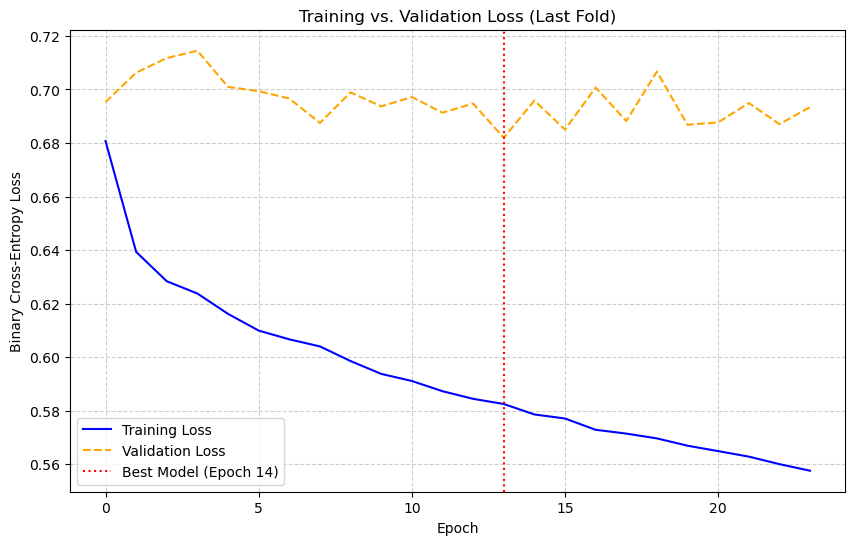

In [52]:
# --- 2. Plot the loss curves ---
if last_history:
    print("\nPlotting loss curves from the last training fold...")

    train_loss = last_history["train_loss"]
    val_loss = last_history["val_loss"]

    plt.figure(figsize=(10, 6))
    plt.plot(train_loss, label="Training Loss", color="blue")
    plt.plot(val_loss, label="Validation Loss", color="orange", linestyle="--")

    # Find the epoch with the best validation loss
    best_epoch = np.argmin(val_loss)
    plt.axvline(
        best_epoch,
        color="red",
        linestyle=":",
        label=f"Best Model (Epoch {best_epoch + 1})",
    )

    plt.title("Training vs. Validation Loss (Last Fold)")
    plt.xlabel("Epoch")
    plt.ylabel("Binary Cross-Entropy Loss")
    plt.legend()
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.show()

else:
    print("No history was captured. Did the training loop run?")

#### Analysis of LSTM Training vs. Validation Loss

This plot clearly illustrates that the model begins to overfit almost immediately. The regularization (Dropout and L2 weight decay) is **insufficient** to control the model's high complexity.

1.  **The Best Model (Epoch 1):** The model achieves its lowest validation loss at the very beginning of training (at index 0, labeled "Epoch 1"). This is the single point where the model found a generalizable pattern. The `EarlyStopping` mechanism (red dotted line) correctly identifies this as the best model.

2.  **The Divergence (Epoch 1 onward):** Immediately after this point, the two loss curves diverge dramatically.
    * **Training Loss (Blue):** Steadily decreases from ~0.69 to ~0.62. This shows the model is successfully "memorizing" the specific noise and patterns of the training data.
    * **Validation Loss (Orange):** Steadily *increases* from ~0.70 to ~0.77. This is the critical sign of overfitting. It shows that as the model gets "better" at the training data, it is simultaneously getting *worse* at predicting unseen data from the validation set.

# 5. Binary Classification Models Analysis

## 5.1. McNemar tests

#### Model Significance: McNemar's Test vs. Naive Benchmark

To validate that our models are learning a genuine predictive signal, we must test their performance against a non-trivial baseline. Accuracy scores alone can be misleading, especially in datasets with class imbalance (where one direction, "Up" or "Down", is far more common).

To this end, we will employ **McNemar's test**, a non-parametric test designed to compare the classification errors of two paired models.

#### The Benchmark: Majority Class Classifier

Our benchmark is a **naive "majority class" classifier**. This model is not static; it is re-trained on each of the 79 rolling-window training sets. For each window, it identifies the most frequent class (e.g., "Up") and then predicts *only* that class for the subsequent 4-week test period.

#### Test Rationale

Our hypothesis is that our trained models (Logistic, XGBoost, LSTM) are statistically superior to this naive benchmark. The McNemar test will compare the paired forecast errors of our model and the majority class classifier.

If the test rejects the null hypothesis (that the two models have the same disagreement rate), it provides statistical evidence that our models are effectively learning from the features and are not just defaulting to the most common outcome.

In [34]:
# Define Backtest Configuration

# Define the rolling window parameters
TRAIN_WINDOW_SIZE = 52 * 15  # 15 years of weekly data
FORECAST_HORIZON = 4  # Predict 4 weeks ahead
ROLL_STEP_SIZE = 4  # Roll the window forward by the forecast horizon


In [60]:
models_forecasts = {
    "lr 0.03": pd.read_parquet("model_results/forecast_logreg_MI_0.03.parquet"),
    "lr 0.03 pca": pd.read_parquet("model_results/forecast_logreg_pca_MI_0.03.parquet"),
    "lr 0.035": pd.read_parquet("model_results/forecast_logreg_MI_0.035.parquet"),
    "lr 0.04": pd.read_parquet("model_results/forecast_logreg_MI_0.04.parquet"),
    "lr 0.05": pd.read_parquet("model_results/forecast_logreg_MI_0.05.parquet"),
    "rf 0.03": pd.read_parquet("model_results/forecast_random_forest_MI_0.03.parquet"),
    "rf 0.03 pca": pd.read_parquet(
        "model_results/forecast_random_forest_pca_MI_0.03.parquet"
    ),
    "rf 0.035": pd.read_parquet(
        "model_results/forecast_random_forest_MI_0.035.parquet"
    ),
    "rf 0.04": pd.read_parquet("model_results/forecast_random_forest_MI_0.04.parquet"),
    "rf 0.05": pd.read_parquet("model_results/forecast_random_forest_MI_0.05.parquet"),
    "xg 0.03": pd.read_parquet("model_results/forecast_xgboost_MI_0.03.parquet"),
    "xg 0.035": pd.read_parquet("model_results/forecast_xgboost_MI_0.035.parquet"),
    "xg 0.04": pd.read_parquet("model_results/forecast_xgboost_MI_0.04.parquet"),
    "xg 0.05": pd.read_parquet("model_results/forecast_xgboost_MI_0.05.parquet"),
    "LSTM 0.02": (
        pd.read_parquet("model_results/forecast_LSTM_MI_0.02.parquet") > 0.5
    ).astype(int),
}

We build the majority class classifier below:

In [39]:
majority_class_classifier = {col: [] for col in Yw_binary.columns}

for train_start in range(
    0, len(Xw) - TRAIN_WINDOW_SIZE - FORECAST_HORIZON + 1, FORECAST_HORIZON
):
    train_end = train_start + TRAIN_WINDOW_SIZE
    pred_end = train_end + FORECAST_HORIZON

    for col in Yw_binary.columns:
        Yw_binary_train = Yw_binary.iloc[train_start:train_end][col]
        if Yw_binary_train.mean() < 0.5:
            majority_class_classifier[col].extend([0, 0, 0, 0])
        else:
            majority_class_classifier[col].extend([1, 1, 1, 1])
idx = Yw_binary.iloc[TRAIN_WINDOW_SIZE:].index
majority_class_classifier = pd.DataFrame(index=idx, data=majority_class_classifier)
majority_class_classifier.head()

,Y_DGS1MO,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30
2019-03-08,0,0,0,0,0,0,0,0,0,0,0
2019-03-15,0,0,0,0,0,0,0,0,0,0,0
2019-03-22,0,0,0,0,0,0,0,0,0,0,0
2019-03-29,0,0,0,0,0,0,0,0,0,0,0
2019-04-05,0,0,0,0,0,0,0,0,0,0,0


Notice the majority class classifier predicts only zeros. What is it's accuracy ?

In [58]:
mcc_acc_per_target = (
    (majority_class_classifier == Yw_binary.iloc[TRAIN_WINDOW_SIZE:]).astype(int).mean()
)
mcc_acc_per_target

Y_DGS1MO    0.753289
Y_DGS3MO    0.684211
Y_DGS6MO    0.638158
Y_DGS1      0.575658
Y_DGS2      0.549342
Y_DGS3      0.519737
Y_DGS5      0.526316
Y_DGS7      0.529605
Y_DGS10     0.546053
Y_DGS20     0.539474
Y_DGS30     0.542763
dtype: float64

In [352]:
models_forecasts["MCC"] = majority_class_classifier

We can now run the McNemar test:

In [133]:
mcn_pvalues = pd.DataFrame(index=models_forecasts.keys(), columns=Yw_binary.columns)

for key in models_forecasts.keys():
    for col in Yw_binary.columns:
        y_pred = models_forecasts[key][col]
        y_benchmark = majority_class_classifier[col]
        y_true = Yw_binary.iloc[TRAIN_WINDOW_SIZE:][col]
        # McNemar test
        correct_model = y_pred == y_true
        correct_benchmark = y_benchmark == y_true
        table = confusion_matrix(correct_model, correct_benchmark)
        result = mcnemar(table, exact=False, correction=True)
        mcn_pvalues.loc[key, col] = result.pvalue
mcn_pvalues = mcn_pvalues.astype(np.float64())
mcn_pvalues.index = mcn_pvalues.index.rename("Models")

/opt/miniconda3/envs/myenv/lib/python3.11/site-packages/statsmodels/stats/contingency_tables.py:1348: RuntimeWarning: divide by zero encountered in scalar divide
  statistic = (np.abs(n1 - n2) - corr)**2 / (1. * (n1 + n2))
/opt/miniconda3/envs/myenv/lib/python3.11/site-packages/statsmodels/stats/contingency_tables.py:1348: RuntimeWarning: divide by zero encountered in scalar divide
  statistic = (np.abs(n1 - n2) - corr)**2 / (1. * (n1 + n2))
/opt/miniconda3/envs/myenv/lib/python3.11/site-packages/statsmodels/stats/contingency_tables.py:1348: RuntimeWarning: divide by zero encountered in scalar divide
  statistic = (np.abs(n1 - n2) - corr)**2 / (1. * (n1 + n2))
/opt/miniconda3/envs/myenv/lib/python3.11/site-packages/statsmodels/stats/contingency_tables.py:1348: RuntimeWarning: divide by zero encountered in scalar divide
  statistic = (np.abs(n1 - n2) - corr)**2 / (1. * (n1 + n2))
/opt/miniconda3/envs/myenv/lib/python3.11/site-packages/statsmodels/stats/contingency_tables.py:1348: Runtim

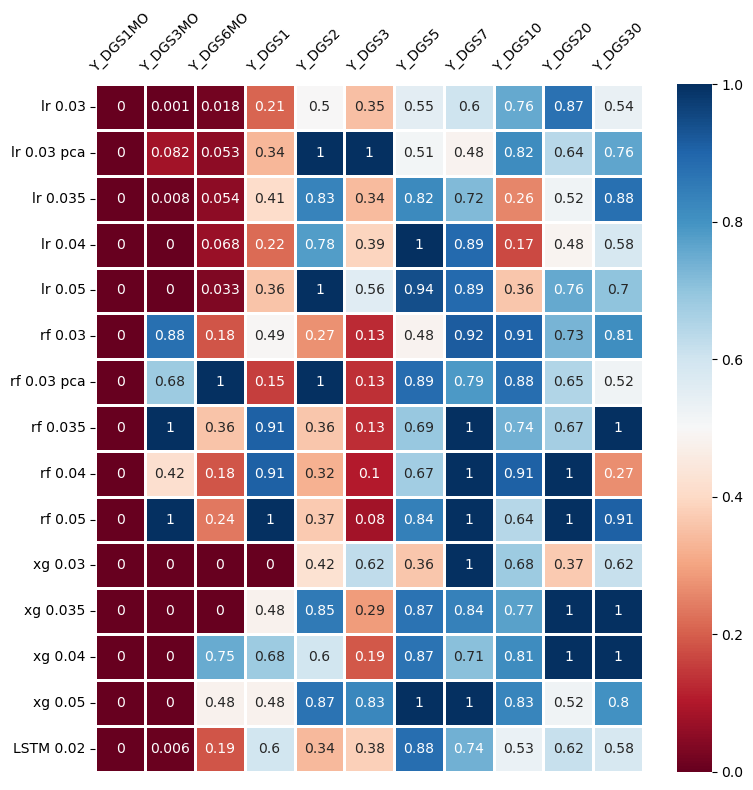

In [129]:
plt.figure(figsize=[8, 8])
sns.heatmap(
    data=mcn_pvalues.round(3),
    cmap="RdBu",
    annot=True,
    linewidths=1,
)
plt.tick_params(
    axis="both",
    which="major",
    labelbottom=False,
    bottom=False,
    top=False,
    labeltop=True,
)
plt.xticks(rotation=45)

plt.tight_layout()

Below are the p-value of McNemar test for each of the models trained, for each yield in the yield curve. The $H_0$ hypothesis of this test is : "The model has no better error rate than the majority class classifier". 

Each name of column of this dataframe is in 3 parts:
- 'lr' or 'rf' or 'xg' or 'lstm', depending on whether the model is a logistic regression, a random forest, an XGBoost or an LSTM, 
- '0.03' or '0.035' or '0.04' or '0.05' depending on the dataset on which the model was trained. As a reminder, this number represents the threshold of mutual information with which we filtered the training features. For instance, for the dataset labelled as 0.03 we kept only features with a mutual information shared with the targets above 0.03.
- 'pca' or 'blank' depending on whether we applied a PCA to reduce dimensionality before training the model. 

For instance, the first cell of the model is associated to the logistic regression model trained on the dataset of features with mutual information above 0.03 and on the 1 month yields.

Remark: we had to remove the XGboost model with PCA because it only predicted some zeros, which resulted in errors when running the test. 

The models with a performance significatively better than the constant benchmark classifier (pvalue <0.1) are listed below. There is a 1 in the cell if the model forecasting power is statistically significant and a 0 otherwise:

In [139]:
models_significances = (mcn_pvalues < 0.1).astype(int)
models_significances = models_significances.assign(
    **{"Number of Significative Forecast": models_significances.sum(1)}
)
models_significances.loc["Number of Significative Models"] = models_significances.sum(0)
models_significances

,Y_DGS1MO,Y_DGS3MO,Y_DGS6MO,Y_DGS1,Y_DGS2,Y_DGS3,Y_DGS5,Y_DGS7,Y_DGS10,Y_DGS20,Y_DGS30,Number of Significative Forecast
Models,,,,,,,,,,,,
lr 0.03,1,1,1,0,0,0,0,0,0,0,0,3
lr 0.03 pca,1,1,1,0,0,0,0,0,0,0,0,3
lr 0.035,1,1,1,0,0,0,0,0,0,0,0,3
lr 0.04,1,1,1,0,0,0,0,0,0,0,0,3
lr 0.05,1,1,1,0,0,0,0,0,0,0,0,3
rf 0.03,1,0,0,0,0,0,0,0,0,0,0,1
rf 0.03 pca,1,0,0,0,0,0,0,0,0,0,0,1
rf 0.035,1,0,0,0,0,0,0,0,0,0,0,1
rf 0.04,1,0,0,0,0,0,0,0,0,0,0,1


We can see that there are large disparities in terms of statistical significance for the different models and different parts of the yield curve:  
- We can see that most models have a statistically significant forecasting power on the short end of the yield curve, and particularly for 1-month, 3-month and 6-month yields.
- no model manages to have a statistically significant forecasting power on the longer term yields, from 5-year up to 30-year yields; this is not surprising, because long-term yields are not as much driven by macroeconomic, financial and monetary variables as short-term yields. Long-term yields mostly depend on expectations of future short rates over many years, which are latent and difficult to model and observe. As a result, long-term yields are more difficult to forecast. 

Generally, the models that best succeed in producing classifiers with a statistically significant forecasting power are logistic regressions and XGBoost. On this dataset, logistic regression produces slightly fewer significantly performing classifiers. This therefore illustrates an advantage of tree-based models, which manage to capture nonlinearities in the data and thus outperform logistic regression.

## 5.2. Analysis of the out-of-sample accuracy of the models

Now, we can observe and analyze the average out-of-sample accuracy of all the models that were trained over the 79 fifteen year rolling windows:

In [206]:
models_accuracies = {
    "lr 0.03": pd.read_parquet(
        "model_results/accuracies_logreg_MI_0.03.parquet"
    ).mean(),
    "lr 0.03 pca": pd.read_parquet(
        "model_results/accuracies_logreg_pca_MI_0.03.parquet"
    ).mean(),
    "lr 0.035": pd.read_parquet(
        "model_results/accuracies_logreg_MI_0.035.parquet"
    ).mean(),
    "lr 0.04": pd.read_parquet(
        "model_results/accuracies_logreg_MI_0.04.parquet"
    ).mean(),
    "lr 0.05": pd.read_parquet(
        "model_results/accuracies_logreg_MI_0.05.parquet"
    ).mean(),
    "rf 0.03": pd.read_parquet(
        "model_results/accuracies_random_forest_MI_0.03.parquet"
    ).mean(),
    "rf 0.03 pca": pd.read_parquet(
        "model_results/accuracies_random_forest_pca_MI_0.03.parquet"
    ).mean(),
    "rf 0.035": pd.read_parquet(
        "model_results/accuracies_random_forest_MI_0.035.parquet"
    ).mean(),
    "rf 0.04": pd.read_parquet(
        "model_results/accuracies_random_forest_MI_0.04.parquet"
    ).mean(),
    "rf 0.05": pd.read_parquet(
        "model_results/accuracies_random_forest_MI_0.05.parquet"
    ).mean(),
    "xg 0.03": pd.read_parquet(
        "model_results/accuracies_xgboost_MI_0.03.parquet"
    ).mean(),
    "xg 0.035": pd.read_parquet(
        "model_results/accuracies_xgboost_MI_0.035.parquet"
    ).mean(),
    "xg 0.04": pd.read_parquet(
        "model_results/accuracies_xgboost_MI_0.04.parquet"
    ).mean(),
    "xg 0.05": pd.read_parquet(
        "model_results/accuracies_xgboost_MI_0.05.parquet"
    ).mean(),
    "LSTM 0.02": pd.read_parquet(
        "model_results/accuracies_LSTM_MI_0.02.parquet"
    ).mean(),
    "MCC": mcc_acc_per_target,
}

models_accuracies = pd.DataFrame(models_accuracies)
models_accuracies.columns = models_accuracies.columns.rename("Models")
models_accuracies = models_accuracies.reindex(index=Yw_binary.columns)
models_accuracies.index = models_accuracies.index.rename("Target")
models_accuracies.round(2)

Models,lr 0.03,lr 0.03 pca,lr 0.035,lr 0.04,lr 0.05,rf 0.03,rf 0.03 pca,rf 0.035,rf 0.04,rf 0.05,xg 0.03,xg 0.035,xg 0.04,xg 0.05,LSTM 0.02,MCC
Target,,,,,,,,,,,,,,,,
Y_DGS1MO,0.45,0.53,0.47,0.44,0.46,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75,0.75
Y_DGS3MO,0.55,0.61,0.58,0.53,0.52,0.68,0.68,0.68,0.66,0.68,0.68,0.68,0.68,0.68,0.62,0.68
Y_DGS6MO,0.53,0.55,0.55,0.56,0.54,0.67,0.64,0.66,0.67,0.67,0.64,0.64,0.64,0.64,0.60,0.64
Y_DGS1,0.51,0.53,0.54,0.52,0.53,0.60,0.60,0.58,0.58,0.57,0.58,0.57,0.58,0.58,0.55,0.58
Y_DGS2,0.51,0.55,0.54,0.53,0.55,0.59,0.55,0.58,0.59,0.58,0.54,0.56,0.54,0.54,0.54,0.55
Y_DGS3,0.56,0.52,0.57,0.56,0.55,0.58,0.57,0.58,0.58,0.59,0.54,0.55,0.56,0.53,0.50,0.52
Y_DGS5,0.56,0.56,0.54,0.53,0.53,0.55,0.52,0.54,0.54,0.54,0.55,0.53,0.53,0.52,0.53,0.53
Y_DGS7,0.50,0.49,0.51,0.52,0.54,0.53,0.54,0.53,0.53,0.53,0.53,0.53,0.52,0.53,0.51,0.53
Y_DGS10,0.53,0.53,0.49,0.48,0.50,0.54,0.54,0.56,0.54,0.53,0.55,0.54,0.54,0.54,0.53,0.55


For each maturity in the yield curve, we will identify the model providing the best average out-of-sample accuracy and it's statistical significance:

In [354]:
best_oos_acc = pd.DataFrame(
    index=Yw_binary.columns,
    columns=["Best Model", "Average Accuracy", "Statistical Significance"],
)
best_oos_acc["Best Model"] = models_accuracies.idxmax(1).values
best_oos_acc["Average Accuracy"] = models_accuracies.max(1).round(2)
for row, col in zip(best_oos_acc["Best Model"].values, best_oos_acc.index):
    best_oos_acc.loc[col, "Statistical Significance"] = mcn_pvalues.loc[row, col].round(
        3
    )
best_oos_acc


,Best Model,Average Accuracy,Statistical Significance
Y_DGS1MO,rf 0.03,0.75,0.0
Y_DGS3MO,xg 0.03,0.68,0.0
Y_DGS6MO,rf 0.03,0.67,0.185
Y_DGS1,rf 0.03 pca,0.60,0.153
Y_DGS2,rf 0.03,0.59,0.271
Y_DGS3,rf 0.05,0.59,0.08
Y_DGS5,lr 0.03 pca,0.56,0.512
Y_DGS7,lr 0.05,0.54,0.889
Y_DGS10,rf 0.035,0.56,0.74
Y_DGS20,rf 0.035,0.56,0.668


##### Some important observations on the models, the features used and the overall accuracy:

- In most cases, random forests are performing the best in terms of out of sample average accuracy. 8 out of 11 yield maturities are better forecasted by random forests. But only 2 of those models are significative.

- Overall, our models manage to get a satisfying out-of-sample accuracy on the short-end of the yield curve, for less than 2-year maturities yields. For maturities of one year or less, we manage to get average out-of-sample accuracies above 60% and even up to 75%. We are rather satisfied with these figures and these models could be useful signals to implement trading strategies. However we could not implement a strategy as we could not access data on US bond prices.

- It is more difficult to forecast the medium-end and long-end of the yield curve (yields of bonds with maturities above 1 year): for these yields, we get an average out-of-sample accuracy between 0.54 and 0.59. This is less satisfying and our models provide a weaker signal on those yields. The lower predictive power of our models on the long-end of the yield curve confirms the lack of statistical significance of the forecasting power of the models on these yields.

- Even if in some cases, random forests provide a higher out-of-sample accuracy than linear regression, this improvement is only marginal. This improvement may be marginal compared to the increase in complexity and the loss of interpretability of the model.

- For most yields, the datasets containing features with mutual information above 0.03 or 0.035 are the datasets providing the best trained models. These are the datasets containing a set of macroeconomic and financial variables, as well as functions of the past yields (lags, rolling means, quantiles, ...).

Let's get some more insights on our models performances, looking at the average proportion of 1s predicted by each of them.

In [353]:
models_forecasts_prop = {model: df.mean() for model, df in models_forecasts.items()}
models_forecasts_prop = pd.DataFrame(models_forecasts_prop)
models_forecasts_prop.columns = models_forecasts_prop.columns.rename("Models")
models_forecasts_prop = models_forecasts_prop.reindex(index=Y_weekly.columns)
models_forecasts_prop.index = models_forecasts_prop.index.rename("Target")
models_forecasts_prop.round(2)

Models,lr 0.03,lr 0.03 pca,lr 0.035,lr 0.04,lr 0.05,rf 0.03,rf 0.03 pca,rf 0.035,rf 0.04,rf 0.05,xg 0.03,xg 0.035,xg 0.04,xg 0.05,LSTM 0.02,MCC
Target,,,,,,,,,,,,,,,,
Y_DGS1MO,0.55,0.47,0.51,0.64,0.59,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
Y_DGS3MO,0.47,0.48,0.48,0.51,0.58,0.14,0.02,0.17,0.12,0.11,0.00,0.00,0.00,0.00,0.10,0.0
Y_DGS6MO,0.60,0.60,0.55,0.57,0.61,0.19,0.04,0.19,0.19,0.19,0.00,0.00,0.03,0.01,0.09,0.0
Y_DGS1,0.67,0.60,0.58,0.62,0.65,0.25,0.08,0.26,0.24,0.24,0.00,0.01,0.02,0.01,0.11,0.0
Y_DGS2,0.72,0.69,0.66,0.66,0.71,0.33,0.10,0.32,0.34,0.33,0.05,0.10,0.11,0.12,0.13,0.0
Y_DGS3,0.54,0.68,0.62,0.64,0.62,0.41,0.29,0.41,0.40,0.39,0.22,0.24,0.27,0.28,0.15,0.0
Y_DGS5,0.60,0.62,0.55,0.62,0.62,0.33,0.16,0.33,0.29,0.33,0.10,0.12,0.12,0.15,0.14,0.0
Y_DGS7,0.59,0.66,0.65,0.66,0.67,0.30,0.18,0.32,0.31,0.33,0.06,0.08,0.10,0.11,0.12,0.0
Y_DGS10,0.54,0.55,0.57,0.56,0.57,0.24,0.14,0.27,0.25,0.25,0.02,0.04,0.06,0.07,0.13,0.0


Let's compare the distribution of classes forecast by our models with the true distribution of classes in the data:

In [189]:
Yw_binary.iloc[TRAIN_WINDOW_SIZE:].mean()

Y_DGS1MO    0.246711
Y_DGS3MO    0.315789
Y_DGS6MO    0.361842
Y_DGS1      0.424342
Y_DGS2      0.450658
Y_DGS3      0.480263
Y_DGS5      0.473684
Y_DGS7      0.470395
Y_DGS10     0.453947
Y_DGS20     0.460526
Y_DGS30     0.457237
dtype: float64

LSTM and XGBoost models mainly predict 0s. Random forests tend to have correct proportions on the mid-term end of the yield curve, while logistic regressions are better on the long-term end. This is coherent with our analysis on models accuracies. Note that the former tends to undershoot the correct proportion while the latter overshoots. Also note that the proportions of 1s in the targets are low for short-term maturities, so there is bias in the accuracies for models that tend to predict only 0s. It would be interesting to run a similar analysis on better balanced data.

## 5.3. Ensemble Learning

Let's implement a toy ensemble learning model, specialized in forecasting the short-end of the yield curve bar the 1-month maturity (bias in accuracy metric). As our models predictions aren't statistically on the long-end, we won't try to build an ensemble model for thos targets.

In [246]:
models_accuracies.iloc[1:4].mean().sort_values(ascending=False)

Models
rf 0.03        0.650219
rf 0.05        0.641447
rf 0.03 pca    0.640351
rf 0.035       0.640351
rf 0.04        0.638158
xg 0.05        0.637061
xg 0.03        0.632675
xg 0.04        0.632675
MCC            0.632675
xg 0.035       0.630482
LSTM 0.02      0.588816
lr 0.03 pca    0.563596
lr 0.035       0.554825
lr 0.04        0.535088
lr 0.05        0.530702
lr 0.03        0.529605
dtype: float64

In [343]:
chosen_models = ["rf 0.03", "xg 0.05", "lr 0.03"]
print(f"Chosen models are {chosen_models}.")


Chosen models are ['rf 0.03', 'xg 0.05', 'lr 0.03'].


In [347]:
y_true = Yw_binary.iloc[TRAIN_WINDOW_SIZE:][["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]]
models_rolling_accuracies = {}
for model in chosen_models:
    model_forecast = models_forecasts[model][["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]]
    model_rolling_accuracy = (
        (model_forecast == y_true).astype(int).rolling(window=4).mean()
    ).mean(1)
    models_rolling_accuracies[model] = model_rolling_accuracy
models_rolling_accuracies = pd.DataFrame(models_rolling_accuracies).dropna()
models_rolling_accuracies.head()

,rf 0.03,xg 0.05,lr 0.03
2019-03-29,0.916667,0.916667,0.666667
2019-04-05,0.750000,0.750000,0.666667
2019-04-12,0.750000,0.750000,0.750000
2019-04-19,0.750000,0.750000,0.750000
2019-04-26,0.833333,0.833333,0.666667


In [351]:
weigths = (
    models_rolling_accuracies.div(models_rolling_accuracies.sum(1), axis=0)
    .shift()
    .dropna()
)  # shift so that the weigths are point in time.
weigths

,rf 0.03,xg 0.05,lr 0.03
2019-04-05,0.366667,0.366667,0.266667
2019-04-12,0.346154,0.346154,0.307692
2019-04-19,0.333333,0.333333,0.333333
2019-04-26,0.333333,0.333333,0.333333
2019-05-03,0.357143,0.357143,0.285714
...,...,...,...
2024-11-29,0.368421,0.368421,0.263158
2024-12-06,0.428571,0.428571,0.142857
2024-12-13,0.428571,0.380952,0.190476
2024-12-20,0.434783,0.434783,0.130435


/var/folders/l4/rqys14ws2955nprxbdsj722r0000gn/T/ipykernel_29946/3206077680.py:3: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  ).fillna(0)


,Y_DGS3MO,Y_DGS6MO,Y_DGS1
2021-09-24,0,0,0
2021-10-29,0,0,0
2023-05-19,0,1,1
2020-06-19,0,0,0
2023-02-24,1,1,1
2023-04-28,1,1,1
2024-12-13,0,0,0
2019-11-08,0,0,0
2024-01-19,0,0,1
2020-03-06,0,0,0


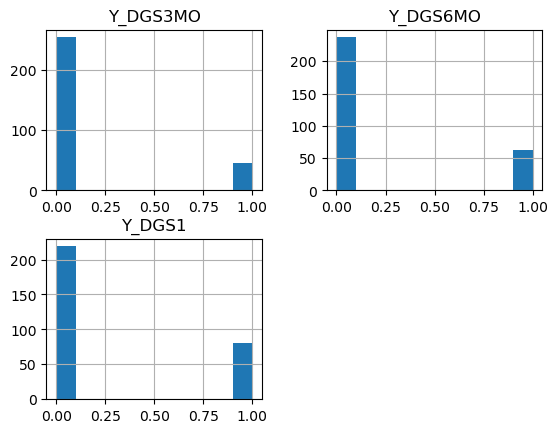

In [399]:
ensemble_predictions = pd.DataFrame(
    index=weigths.index, columns=["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]
).fillna(0)
for model in chosen_models:
    ensemble_predictions += (
        models_forecasts[model][["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]]
        .reindex(index=weigths.index)
        .mul(weigths[model], axis=0)
    )
ensemble_predictions = (ensemble_predictions > 0.4).astype(int)
ensemble_predictions.hist()
ensemble_predictions.sample(10)


In [400]:
ensemble_accucary = (
    (
        ensemble_predictions
        == Yw_binary.reindex(index=ensemble_predictions.index)[
            ["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]
        ]
    )
    .astype(int)
    .mean()
)
ensemble_accucary.round(3)

Y_DGS3MO    0.660
Y_DGS6MO    0.677
Y_DGS1      0.597
dtype: float64

In [389]:
models_accuracies.loc[["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]].round(3)

Models,lr 0.03,lr 0.03 pca,lr 0.035,lr 0.04,lr 0.05,rf 0.03,rf 0.03 pca,rf 0.035,rf 0.04,rf 0.05,xg 0.03,xg 0.035,xg 0.04,xg 0.05,LSTM 0.02,MCC
Target,,,,,,,,,,,,,,,,
Y_DGS3MO,0.546,0.612,0.576,0.533,0.523,0.678,0.678,0.681,0.664,0.681,0.684,0.684,0.684,0.684,0.622,0.684
Y_DGS6MO,0.530,0.549,0.553,0.556,0.539,0.674,0.641,0.664,0.674,0.671,0.638,0.638,0.638,0.645,0.595,0.638
Y_DGS1,0.513,0.530,0.536,0.516,0.530,0.599,0.602,0.576,0.576,0.572,0.576,0.569,0.576,0.582,0.549,0.576


We get marginal performance increase.

## 5.4. Evolution of the performance of the models 

We will plot the evolution through time of the 3 months rolling average out-of-sample accuracy of the models. This will allow us to see if the models are consistently performing through time or if they are only reliable at some specific periods of time. We will focus on the models forecasting the short-term yields as it is where they are the most successful. We will only focus on the models that are statistically significant. They are given below: there is a NaN in the dataframe if the model is not statistically significant:

In [324]:
sig = models_significances[["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]][:-1].sum(1)
chosen_models = sig[sig >= 2].index
print(f"Chosen models are {chosen_models}")
y_true = Yw_binary.iloc[TRAIN_WINDOW_SIZE:][["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]]


Chosen models are Index(['lr 0.03', 'lr 0.03 pca', 'lr 0.035', 'lr 0.04', 'lr 0.05', 'xg 0.03',
       'xg 0.035'],
      dtype='object', name='Models')


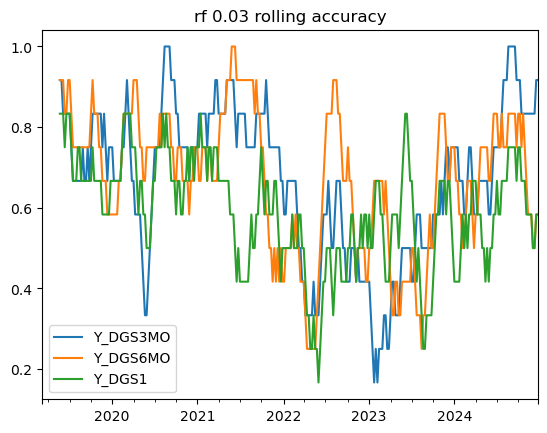

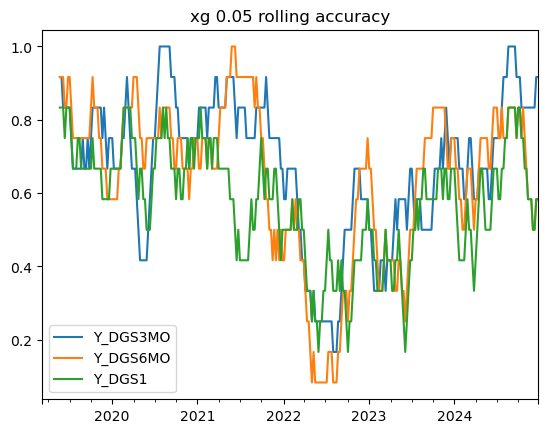

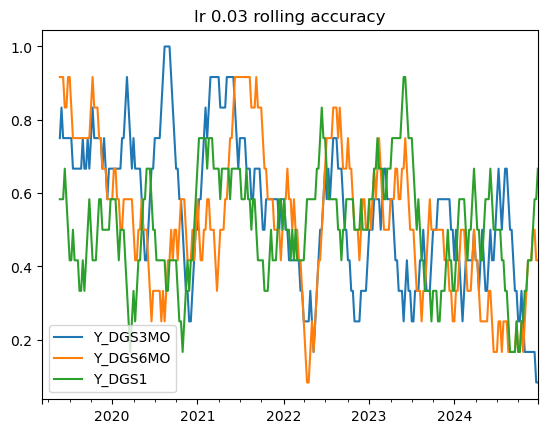

In [406]:
for model in chosen_models:
    model_forecast = models_forecasts[model][["Y_DGS3MO", "Y_DGS6MO", "Y_DGS1"]]
    model_accuracy = (model_forecast == y_true).rolling(window=12).mean()
    model_accuracy.plot(title=model + " rolling accuracy")


<Axes: >

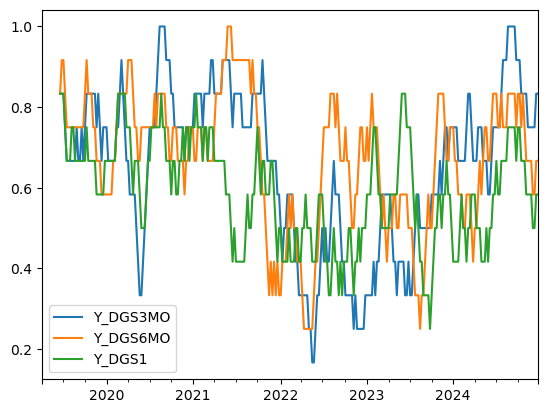

In [407]:
(ensemble_predictions == y_true.reindex_like(ensemble_predictions)).astype(int).rolling(
    window=12
).mean().plot()

Note :
- Models have rolling accuracies that are most of the time above 0.5, but it is very volatile.
- The rolling accuracies experience a significant drop between 2022 and 2024, bar the logistic regression model. This period correspond to rates hike, and we know most of our models are biased toward predicting 0s.@

Once again the benchmark is difficult to beat consistently. 

# 6. Conclusion


This project aimed to predict the yield curve of US government bonds using macroeconomic data from the FED, market variables, and functions of past yields. Our objective was to compare linear models with complex non-linear models to see if the relationships between financial variables are linear, or if there are significant nonlinearities allowing complex models to outperform simple linear models. 

Initially, we attempted to perform regression on the daily yields difference. The penalized linear models (Ridge, Lasso, and Elastic Net) failed to identify a relationship between the yields and the features used. Performing a PCA on the dataset to reduce the number of features and their correlation did not improve the predictions: the out-of-sample $\text{R}^2$ is systematically close to zero or negative, and the in-sample $\text{R}^2$ oscillates between 0 and 0.4, meaning that the features do not effectively explain the variance of the yields, even in-sample. Given this finding, we decided to switch to binary classification models on weekly data: our second objective was to predict whether the yields would increase ($Y=1$) or decrease ($Y=0$) each week.

For this binary classification task, we trained our models on several feature datasets: a first dataset contains all features that have a shared mutual information with the Y greater than 0.03, a second greater than 0.035, a third greater than 0.04, and a last one greater than 0.05. As this mutual information threshold increases, the number of features in the dataset decreases: in particular, for the datasets with mutual information greater than 0.04 and 0.05, there are almost no macroeconomic and market features left, and all features contained in this dataset are functions of past yields. The idea of training models on different feature datasets was thus to see whether the models could successfully select features in a high-dimensional dataset, or if it was better to filter only the best features with the highest mutual information, even at the cost of sacrificing macroeconomic and financial variables. The models trained were the following: logistic regression, Random Forest, XGBoost, and LSTM. We trained these models on a total of 4 feature datasets ($\text{X}$) and on 11 different target variables ($\text{Y}$), specifically the yield variations for 1 month, 3 months, 6 months, $\dots$, up to 30 years. This resulted in a total of 171 models. These 171 models were successively re-trained on 15-year rolling periods and predicted the yield variations for the subsequent four weeks. Our main findings regarding these classifier models are the following:

* When performing McNemar's tests to determine if our models have statistically significant predictive power, it appears that it is primarily the models predicting short-term yields (less than one year) that statistically outperform the "majority class classifier" benchmark.
* Random Forest models perform well on short-term yields and often provide the best average out-of-sample accuracy, which reaches up to 71% for 3-month yields. In some cases, Random Forest models provide a marginal improvement in accuracy compared to Logistic Regression and seem to manage to capture non-linearity in the data. However, this comes at the cost of model interpretability: we can therefore be satisfied with logistic regressions as they effectively exploit the predictive power of the features while remaining simple models.
* XGBoost and LSTM, which are the most complex models, tend to predict only zeros or very close to it. These models overfit the data massively and are very ineffective.
* For long-term yields, the results from all models are disappointing, and they rarely perform statistically better than the "majority class classifier" benchmark: this suggests that the models struggle to learn anything from the features. This is not surprising as long-term yields depend less on macroeconomic variables than short-term yields.
* The dataframes that yield the best results are generally those containing a mix of macroeconomic data, financial data, and functions of past yields (mutual information $>0.035$), which confirms that the FED's macro data is useful for predicting yields. However, for 1-month yields, the best dataset for predicting these yields is the one that contains only functions of past yields (Mutual information $> 0.05$): an out-of-sample accuracy of $\mathbf{0.65}$ can be achieved solely with functions of past yields, which illustrates the strong trend-following and mean-reverting nature of these yields.

Future extensions of this project could include:

* Further work on ensemble learning models, which seem quite promising for aggregating the results of our trained models.
* An analysis of the evolution of feature importance over time, to understand which features are identified as the best by the models in each rolling training period. This could allow for more advanced feature engineering and focus on the most promising features.
* The implementation of a trading strategy on US bonds with maturity less than one year, based on this signal. For this, we will need the bond prices.